# Unsupervised Text Classification with BERT

### Contents
* [1. Setup](#1._Setup)
    * [1.1 Import](#1.1_Import)
    * [1.2 Load Data](#1.2_Load_Data)
    * [1.3 Slice Data](#1.3_Slice_Data)
* [2. Preprocessing](#2._Preprocessing)
* [3. Create Target Cluster](#3._Create_Target_Cluster)
    * [3.1 Test_Gensim_API](#3.1_Test_Gensim)
    * [3.2 Apply Most Similar Function](#3.2_Apply_Most_Similar)
    * [3.3 Visualize Cluster](#3.3_Visualize_Cluster)
* [4. Feature Engineering](#4._Feature_Engineering)
    * [4.1 Load Bert](#4.1_Load_Bert)
    * [4.2 Bert Demo](#4.2_Bert_Demo)
    * [4.3 Convert Text As Embedded](#4.3_Convert_Text)
* [5. Model Design](#5._Model_Design)
* [6. Testing](#6._Testing)
* [7. Explainability](#7._Explainability)



github <br>
https://github.com/mdipietro09/DataScience_ArtificialIntelligence_Utils/blob/master/natural_language_processing/example_text_classification.ipynb

article 1<br>
text analysis and feature engineering <br>
https://towardsdatascience.com/text-analysis-feature-engineering-with-nlp-502d6ea9225d

article 2<br>
Text clssification tdidf word2vec bert <br>
https://towardsdatascience.com/text-classification-with-nlp-tf-idf-vs-word2vec-vs-bert-41ff868d1794

article 3<br>
BERT with no model training<br>
https://towardsdatascience.com/text-classification-with-no-model-training-935fe0e42180


**Topic Modelling**<br>
LDA on trump tweets<br>
https://medium.datadriveninvestor.com/trump-tweets-topic-modeling-using-latent-dirichlet-allocation-e4f93b90b6fe

Bert keyword<br>
https://towardsdatascience.com/keyword-extraction-with-bert-724efca412ea

Bert topic<br>
https://towardsdatascience.com/topic-modeling-with-bert-779f7db187e6

## 1 - Setup <a id='1._Setup'></a>

### 1.1 Import<a id='1.1_Import'></a>

In [2]:
## for data
import json
import pandas as pd
import numpy as np
from sklearn import metrics, manifold

## for pre-processing
import re
import nltk
# nltk.download('wordnet')

## for plotting
import matplotlib.pyplot as plt
import seaborn as sns

## for w2v
import gensim
import gensim.downloader as gensim_api

## for bert
import transformers

/Users/sherlyhartono/opt/anaconda3/lib/python3.8/site-packages/gensim/similarities/__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


### 1.2 Load Data<a id='1.2_Load_Data'></a>

In [3]:
# create empty list for our dictionary
list_dictionary = []

# open json
with open('news.json', mode='r', errors='ignore') as json_file:
    # add each item in json file to our list of dictionary
    for item in json_file:
        list_dictionary.append( json.loads(item) )
        
list_dictionary[0]

{'category': 'CRIME',
 'headline': 'There Were 2 Mass Shootings In Texas Last Week, But Only 1 On TV',
 'authors': 'Melissa Jeltsen',
 'link': 'https://www.huffingtonpost.com/entry/texas-amanda-painter-mass-shooting_us_5b081ab4e4b0802d69caad89',
 'short_description': 'She left her husband. He killed their children. Just another day in America.',
 'date': '2018-05-26'}

In [4]:
# convert our list to pandas df

df = pd.DataFrame(list_dictionary)
df.head(5)

,category,headline,authors,link,short_description,date
0,CRIME,There Were 2 Mass Shootings In Texas Last Week...,Melissa Jeltsen,https://www.huffingtonpost.com/entry/texas-ama...,She left her husband. He killed their children...,2018-05-26
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,Andy McDonald,https://www.huffingtonpost.com/entry/will-smit...,Of course it has a song.,2018-05-26
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,Ron Dicker,https://www.huffingtonpost.com/entry/hugh-gran...,The actor and his longtime girlfriend Anna Ebe...,2018-05-26
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,Ron Dicker,https://www.huffingtonpost.com/entry/jim-carre...,The actor gives Dems an ass-kicking for not fi...,2018-05-26
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,Ron Dicker,https://www.huffingtonpost.com/entry/julianna-...,"The ""Dietland"" actress said using the bags is ...",2018-05-26


### 1.3 Slice Data<a id='1.3_Slice_Data'></a>

In [5]:
# 1. slice rows and columns
# rows: get rows where category is entertainment, politics and tech only
# column: get only category and headline columns

df = df[df['category'].isin(['ENTERTAINMENT','POLITICS','TECH'])
][["category","headline"]]

# 2. rename columns
df = df.rename(columns = {"category":"y", "headline":"text"})

In [6]:
df.sample(5)

,y,text
99681,POLITICS,Jordanian Pilot's Death Adds To Worries About ...
3337,POLITICS,Rick Santorum: Kids Should Learn CPR Instead O...
58514,POLITICS,Taking A Leak Is Now A Liberal 'Social Experim...
41039,POLITICS,Donald Trump Takes Victory Lap At Carrier Plant
9813,POLITICS,Super PAC's Facebook Ads Back Roy Moore Becaus...


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 50879 entries, 1 to 200848
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   y       50879 non-null  object
 1   text    50879 non-null  object
dtypes: object(2)
memory usage: 1.2+ MB


## 2 - Preprocessing<a id='2._Preprocessing'></a>

- General cleaning (lower caseing, remove punctuation and characters)
- Remove stopwords 
- Stemming/ Lemmatization

In [8]:
'''
Preprocess a string.
:parameter
    :param text: string - name of column containing text
    :param lst_stopwords: list - list of stopwords to remove
    :param flg_stemm: bool - whether stemming is to be applied
    :param flg_lemm: bool - whether lemmitisation is to be applied
:return
    cleaned text
'''
def preprocess_text(text, flg_stemm=False, flg_lemm=True, list_stopwords=None):
    ## 1. clean (convert to lowercase and remove punctuations and characters and then strip)
    text = re.sub(r'[^\w\s]', '', str(text).lower().strip())   
            
    ## 2. Tokenize (convert from string to list)
    list_text = text.split()     
    
    ## 3. remove Stopwords
    if list_stopwords is not None:
        list_text = [word for word in list_text if word not in 
                    list_stopwords]
                
    ## 4. Stemming (remove -ing, -ly, ...)
    if flg_stemm == True:
        ps = nltk.stem.porter.PorterStemmer()
        list_text = [ps.stem(word) for word in list_text]
                
    ## 5. Lemmatisation (convert the word into root word)
    if flg_lemm == True:
        lem = nltk.stem.wordnet.WordNetLemmatizer()
        list_text = [lem.lemmatize(word) for word in list_text]
            
    ## 5. back to string from list
    text = " ".join(list_text)
    return text

### 2.1 Generate our stopwords

In [9]:
list_stopwords = nltk.corpus.stopwords.words("english")
list_stopwords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

### 2.1 Perform cleaning to our dataset

In [10]:
df["text_clean"] = df["text"].apply(lambda x:
                                    preprocess_text(x,
                                                    flg_stemm=False,
                                                    flg_lemm=True,
                                                    list_stopwords=list_stopwords))

df.head()


,y,text,text_clean
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,smith join diplo nicky jam 2018 world cup offi...
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,hugh grant marries first time age 57
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,jim carrey blast castrato adam schiff democrat...
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,julianna margulies us donald trump poop bag pi...
5,ENTERTAINMENT,Morgan Freeman 'Devastated' That Sexual Harass...,morgan freeman devastated sexual harassment cl...


## 3 - Create Target Cluster<a id='3._Create_Target_Cluster'></a>

The objective of this section is to create some **keywords which can represent the context of each category**<br>

For each category: <br>
- Politcs (obama, trump, clinton, republican)
- Entertainment (celebrity, cinema, move, music)
- Tech (amazon, apple, google, tech)
<br>

We add new keywords to avoud polysemy problems. e.g the word "trump" can have different meanings. We use pre trained Word Embedding model from gensim data to do this. We use most similar word method from gensim to do this.

### 3.1 Test Gensim API<a id = '3.1_Test_Gensim'></a>


In [11]:
nlp = gensim_api.load("glove-wiki-gigaword-300")

In [12]:
nlp.most_similar(["obama","apple"], topn=10)

[('barack', 0.6539768576622009),
 ('bush', 0.5602837800979614),
 ('mccain', 0.5543174743652344),
 ('clinton', 0.5362184047698975),
 ('google', 0.5318784117698669),
 ('iphone', 0.5121558308601379),
 ('microsoft', 0.4754987359046936),
 ('comes', 0.4549912214279175),
 ('hillary', 0.4482893943786621),
 ('kerry', 0.44811466336250305)]

### 3.2 Apply 'most similar' function<a id='3.2_Apply_Most_Similar'></a>


get 30 words that defines each category by first initializing 5 words that we know for sure, then extract 30 more from that

#### Step 1: Define the function

In [13]:
# Function definitions
def get_similar_words(list_original_similar_words, top, nlp):
    list_output = list_original_similar_words
    
    # 1. for each word and score tuple in list of most similar
    for word_score_tuple in nlp.most_similar(list_original_similar_words, topn=top):
        # 2. append each word to our list
        list_output.append(word_score_tuple[0])
    return list(set(list_output))

#### Step 2: Apply the function 

In [14]:
## Create Dictionary {category:[keywords]}
dict_clusters = {}

# get 30 words cluster for each category
dict_clusters["ENTERTAINMENT"] =\
get_similar_words(['celebrity','cinema','movie','music'], top=30, nlp=nlp)

dict_clusters["POLITICS"] =\
get_similar_words(['gop','clinton','president','obama','republican'], top=30, nlp=nlp)

dict_clusters["TECH"] =\
get_similar_words(['amazon','android','app','apple','facebook','google','tech'], top=30, nlp=nlp)


In [15]:
print(dict_clusters["ENTERTAINMENT"],'\n')
print(dict_clusters["POLITICS"],'\n')
print(dict_clusters["TECH"],'\n')


['video', 'musical', 'movies', 'studio', 'premiere', 'theater', 'soundtrack', 'entertainment', 'screen', 'concert', 'hollywood', 'television', 'videos', 'celebrity', 'theatrical', 'documentary', 'shows', 'bollywood', 'filmmakers', 'pop', 'actors', 'movie', 'comedy', 'dance', 'tv', 'cinema', 'featured', 'films', 'film', 'music', 'feature', 'drama', 'audiences', 'genre'] 

['senator', 'nominee', 'obama', 'presidential', 'lawmakers', 'house', 'kerry', 'democratic', 'senate', 'bush', 'democrats', 'gore', 'mccain', 'election', 'clinton', 'aides', 'sen.', 'president', 'romney', 'republicans', 'congress', 'hillary', 'voters', 'congressional', 'gop', 'campaign', 'dole', 'cheney', 'barack', 'gingrich', 'democrat', 'republican', 'candidate', 'rodham', 'administration'] 

['microsoft', 'intel', 'browser', 'online', 'download', 'amazon.com', 'amazon', 'internet', 'google', 'twitter', 'smartphones', 'itunes', 'smartphone', 'android', 'web', 'myspace', 'blackberry', 'user', 'mobile', 'messaging', 'y

### 3.3 Visualize Similar Word Cluster<a id = '3.3_Visualize_Cluster'></a>

Let’s try to visualize those keywords in a 2D space by applying a dimensionality reduction algorithm (i.e. TSNE). We want to make sure that the clusters are well separated from each other.

Steps:
1. Convert our words to word2vec embedding
2. Do dimensionality reduction
3. Create X,y for our plot
4. plot

In [16]:
## 1. word embedding
# a. for value (list of of words) in dict_clusters.values()
# For each value in dict_cluster.values()

# b. for each word in dict_value
# add word to our list

all_similar_words = [word for value in dict_clusters.values() for word in value]
# c. convert to embedded form
X = nlp[all_similar_words]



In [17]:
## 2. Reduce dimension to 2 so we can plot it 
pca = manifold.TSNE(perplexity=40, n_components=2, init='pca')
X = pca.fit_transform(X)



In [18]:
## 3. Create X and Y data for our plot

# 1. prepare empty data frame
df_target = pd.DataFrame()

for key,value in dict_clusters.items():
    # get the end index to slice our X PCA
    #      current length of data frame so far, 
    start_index = len(df_target)
    end_index = len(df_target) + len(value)
    
    # create a data frame for each category
    # assign row entries using our pca result from above
    # get column names
    cluster_df = pd.DataFrame(X[start_index:end_index], columns=["x","y"], 
                             index=value)
    cluster_df["category"] = key
    print(cluster_df)
    df_target = df_target.append(cluster_df)

                       x         y       category
video           7.182855  6.197060  ENTERTAINMENT
musical         9.614479  4.897217  ENTERTAINMENT
movies          8.389103  3.721013  ENTERTAINMENT
studio          8.562407  5.353782  ENTERTAINMENT
premiere        8.678162  4.744567  ENTERTAINMENT
theater         9.620683  4.201546  ENTERTAINMENT
soundtrack      8.883965  5.611941  ENTERTAINMENT
entertainment   8.105250  5.968268  ENTERTAINMENT
screen          7.308759  4.241683  ENTERTAINMENT
concert         9.148461  5.287770  ENTERTAINMENT
hollywood       8.329529  2.934321  ENTERTAINMENT
television      6.392896  4.244810  ENTERTAINMENT
videos          7.154969  6.192476  ENTERTAINMENT
celebrity       6.675808  5.098517  ENTERTAINMENT
theatrical      9.035795  4.441686  ENTERTAINMENT
documentary     7.936436  4.230110  ENTERTAINMENT
shows           7.495987  4.990825  ENTERTAINMENT
bollywood       9.059112  2.471207  ENTERTAINMENT
filmmakers      7.918628  3.267944  ENTERTAINMENT


In [19]:
df

,y,text,text_clean
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,smith join diplo nicky jam 2018 world cup offi...
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,hugh grant marries first time age 57
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,jim carrey blast castrato adam schiff democrat...
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,julianna margulies us donald trump poop bag pi...
5,ENTERTAINMENT,Morgan Freeman 'Devastated' That Sexual Harass...,morgan freeman devastated sexual harassment cl...
...,...,...,...
200844,TECH,Google+ Now Open for Teens With Some Safeguards,google open teen safeguard
200845,TECH,Web Wars,web war
200846,TECH,"First White House Chief Technology Officer, An...",first white house chief technology officer ane...
200847,TECH,Watch The Top 9 YouTube Videos Of The Week,watch top 9 youtube video week


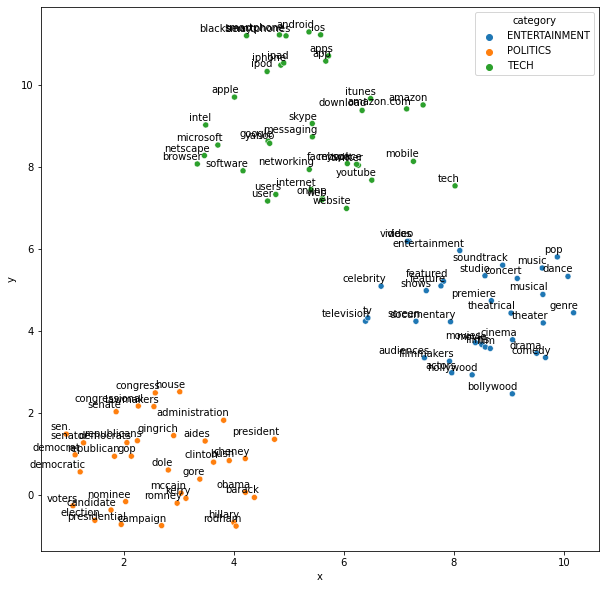

In [20]:
## plot
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(data=df_target, x="x", y="y", hue="category", ax=ax)


# ax.set(xlabel=None, ylabel=None, xticks=[], xticklabels=[], 
#        yticks=[], yticklabels=[])
for i in range(len(df_target)):
    ax.annotate(df_target.index[i], 
               xy=(df_target["x"].iloc[i],df_target["y"].iloc[i]), 
               xytext=(5,2), textcoords='offset points', 
               ha='right', va='bottom')

## 4 - Feature Engineering<a id='4._Feature_Engineering'></a>

insert Text data + target cluseter into Word embedding with BERT to so they can be in the same vector space

![BERT](feature_eng.png)

I’m using BERT for this. It’s true that you could utilize any Word Embedding model (i.e. Word2Vec, Glove, …), even the one that we already loaded to define keywords, so why bother to use such a heavy and complex language model? That’s because BERT doesn’t apply a fixed embedding, instead it looks at the entire sentence and then assigns an embedding to each word. Therefore, the vector BERT assigns to a word is a function of the entire sentence, so that a word can have different vectors based on the contexts.



### 4.1 Load PreTrained Bert <a id = '4.1_Load_Bert'></a>



In [21]:
# 1. get tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained('distilbert-base-uncased', do_lower_case=True)

# 2. get word embedder (encoder)
nlp = transformers.TFDistilBertModel.from_pretrained('distilbert-base-uncased')


Some layers from the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertModel: ['vocab_transform', 'vocab_layer_norm', 'activation_13', 'vocab_projector']
- This IS expected if you are initializing TFDistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFDistilBertModel were initialized from the model checkpoint at distilbert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFDistilBertModel for predictions without further training.


### 4.2 Bert Demo <a id = '4.2_Bert_Demo'></a>

Let’s use the model to convert the string “river bank” into vectors and print the one assigned to the word “bank”:

In [22]:
txt = "river bank"

## 1. tokenize
one_hot_id = tokenizer.encode(txt)
print(one_hot_id)
print("tokens:", tokenizer.convert_ids_to_tokens(one_hot_id))
print("ids   :", tokenizer.encode(txt))

## 2. word embedding
one_hot_id  = np.array(one_hot_id)[None,:]
print('one hot id of our text: ', one_hot_id)
embedding = nlp(one_hot_id)
print("shape:", embedding[0][0].shape)

## 3. vector of the second input word (bank) dimension 1X768
embedding[0][0][2]

[101, 2314, 2924, 102]
tokens: ['[CLS]', 'river', 'bank', '[SEP]']
ids   : [101, 2314, 2924, 102]
one hot id of our text:  [[ 101 2314 2924  102]]
shape: (4, 768)


<tf.Tensor: shape=(768,), dtype=float32, numpy=
array([-1.63812131e-01, -3.73069197e-01, -4.95526314e-01, -4.15768325e-01,
        6.36522174e-01,  5.85348606e-01,  4.18035761e-02,  6.62990928e-01,
       -6.07052483e-02, -4.67017561e-01,  4.22451913e-01,  9.11731347e-02,
        2.17821375e-01,  2.99523562e-01, -1.21685898e+00,  9.92946625e-02,
        9.54551846e-02,  6.96670264e-02,  9.00121748e-01,  9.56986025e-02,
        4.22944725e-01, -1.72001630e-01,  3.98498401e-02,  1.90033734e-01,
       -9.41144451e-02,  2.95003533e-01, -1.09019559e-02,  1.37860596e-01,
        1.16594434e-01,  1.74939126e-01,  6.21107280e-01,  9.57148001e-02,
        1.27020791e-01,  1.42089605e-01, -4.94287938e-01, -7.57253945e-01,
       -2.99661756e-01,  4.80499417e-02, -1.48833498e-01,  2.77393311e-01,
        3.63809988e-02, -5.55701375e-01, -2.51297235e-01,  4.62782204e-01,
        5.57249337e-02, -7.10525960e-02, -4.85667214e-02,  6.39407858e-02,
       -6.81694508e-01, -1.16564229e-01,  1.79601490

In [23]:
txt2 = "financial bank"

## 1. tokenize
one_hot_id = tokenizer.encode(txt2)
print(one_hot_id)
print("tokens:", tokenizer.convert_ids_to_tokens(one_hot_id))
print("ids   :", tokenizer.encode(txt2))

## 2. word embedding
one_hot_id  = np.array(one_hot_id)[None,:]
print('one hot id of our text: ', one_hot_id)
embedding = nlp(one_hot_id)
print("shape:", embedding[0][0].shape)

## 3. vector of the second input word (bank) dimension 1X768
embedding[0][0][2]

[101, 2314, 2924, 102]
tokens: ['[CLS]', 'river', 'bank', '[SEP]']
ids   : [101, 2314, 2924, 102]
one hot id of our text:  [[ 101 2314 2924  102]]
shape: (4, 768)


<tf.Tensor: shape=(768,), dtype=float32, numpy=
array([-1.63812131e-01, -3.73069197e-01, -4.95526314e-01, -4.15768325e-01,
        6.36522174e-01,  5.85348606e-01,  4.18035761e-02,  6.62990928e-01,
       -6.07052483e-02, -4.67017561e-01,  4.22451913e-01,  9.11731347e-02,
        2.17821375e-01,  2.99523562e-01, -1.21685898e+00,  9.92946625e-02,
        9.54551846e-02,  6.96670264e-02,  9.00121748e-01,  9.56986025e-02,
        4.22944725e-01, -1.72001630e-01,  3.98498401e-02,  1.90033734e-01,
       -9.41144451e-02,  2.95003533e-01, -1.09019559e-02,  1.37860596e-01,
        1.16594434e-01,  1.74939126e-01,  6.21107280e-01,  9.57148001e-02,
        1.27020791e-01,  1.42089605e-01, -4.94287938e-01, -7.57253945e-01,
       -2.99661756e-01,  4.80499417e-02, -1.48833498e-01,  2.77393311e-01,
        3.63809988e-02, -5.55701375e-01, -2.51297235e-01,  4.62782204e-01,
        5.57249337e-02, -7.10525960e-02, -4.85667214e-02,  6.39407858e-02,
       -6.81694508e-01, -1.16564229e-01,  1.79601490

If you do the same for the string “financial bank”, you’ll see that the vector assigned to the word “bank” is different because of the context. Please note that the BERT tokenizer inserts special tokens at the beginning and end of sentences and its vector space has a dimension of 768 

### 4.3 Embed our text using Huggingface library transformer <a id = '4.3_Convert_Text'></a>

 the plan is to use BERT Word Embedding to represent each text with an array (shape: number of tokens x 768) and then summarize each article into a mean vector.

![title](summarize.png)

So the final feature matrix will be an array with shape: number of documents (or mean vectors) x 768.

#### 4.3.1 Define function to embed all of our text

In [24]:
## function to apply
def utils_bert_embedding(txt, tokenizer, nlp):
    # 1. tokenize a single text to become one_hot_ids
    idx = tokenizer.encode(txt)
    idx = np.array(idx)[None,:]  
    
    # 2. embed 
    embedding = nlp(idx)
    
    # 3. X is 2nd to last vector/word of each sentence
    X = np.array(embedding[0][0][1:-1])
    return X

#### 4.3.2 Embed text

In [42]:
txt = "river bank"
river_bank_encoded = utils_bert_embedding(txt, tokenizer, nlp)


In [ ]:
# 1. The function will convert our sentence to 1 mean vector of
# all the word vector in a sentence.

# 2. Store the vector in a list
# list_mean_vecs = [utils_bert_embedding(txt, tokenizer, nlp).mean(0)
#                  for txt in df["text_clean"]]


Question Return nan

In [ ]:
# df.isnull().sum()

In [ ]:
# create the feature matrix (n news x 768)
# X = np.array(list_mean_vecs)
# X.shape

In [45]:
# check for empty value
# np.where(np.isnan(X))

#### 4.3.2 Embed target custer

In [ ]:
# dict_y = {}

# for key, value_array in dict_clusters.items():
#     #concatenate defining words
#     defining_words = ' '.join(value_array)
    
#     #convert joined words to vector
#     defining_vector = utils_bert_embedding(defining_words, tokenizer, nlp).mean(0)
    
#     dict_y[key] = defining_vector

### 4.4 Embed Using sentence_transformer

### sample from Maarten

In [26]:
df['text_clean'].iloc[0]

'smith join diplo nicky jam 2018 world cup official song'

In [27]:
# Use shortcut mean of each sentence
from sentence_transformers import SentenceTransformer
import torch    
model = SentenceTransformer('distilbert-base-nli-mean-tokens')


In [158]:
doc = """
         Supervised learning is the machine learning task of 
         learning a function that maps an input to an output based 
         on example input-output pairs.[1] It infers a function 
         from labeled training data consisting of a set of 
         training examples.[2] In supervised learning, each 
         example is a pair consisting of an input object 
         (typically a vector) and a desired output value (also 
         called the supervisory signal). A supervised learning 
         algorithm analyzes the training data and produces an 
         inferred function, which can be used for mapping new 
         examples. An optimal scenario will allow for the algorithm 
         to correctly determine the class labels for unseen 
         instances. This requires the learning algorithm to  
         generalize from the training data to unseen situations 
         in a 'reasonable' way (see inductive bias).
      """

from sklearn.feature_extraction.text import CountVectorizer

n_gram_range = (1, 1)
stop_words = "english"

# Extract candidate words/phrases
count = CountVectorizer(ngram_range=n_gram_range, stop_words=stop_words).fit([doc])
candidates = count.get_feature_names()
print(candidates)

['algorithm', 'allow', 'analyzes', 'based', 'bias', 'called', 'class', 'consisting', 'correctly', 'data', 'desired', 'determine', 'example', 'examples', 'function', 'generalize', 'inductive', 'inferred', 'infers', 'input', 'instances', 'labeled', 'labels', 'learning', 'machine', 'mapping', 'maps', 'new', 'object', 'optimal', 'output', 'pair', 'pairs', 'produces', 'reasonable', 'requires', 'scenario', 'set', 'signal', 'situations', 'supervised', 'supervisory', 'task', 'training', 'typically', 'unseen', 'used', 'value', 'vector', 'way']


In [159]:
# pass an array of text to encode() method
doc_embedding = model.encode([doc])
candidate_embeddings = model.encode(candidates)
# 2d Array
print(doc_embedding)


[[-1.10528159e+00 -4.69009876e-01  6.03155017e-01 -1.38303965e-01
   1.79756790e-01 -5.07916331e-01  9.18429017e-01 -4.82513487e-01
   1.24215019e+00 -5.76116443e-01  3.54348361e-01  6.78826690e-01
  -7.18201756e-01  2.16035377e-02 -3.35593909e-01 -2.33774498e-01
   4.99775678e-01 -4.81828272e-01 -7.77614892e-01 -4.05385643e-01
   1.09467828e+00 -4.64339763e-01  3.40723768e-02  1.32939959e+00
  -2.82225199e-04 -2.83107132e-01  9.21959758e-01  8.30459237e-01
   1.01533845e-01  2.48058975e-01 -1.38199046e-01 -4.20251220e-01
  -2.99474865e-01  6.74286783e-01  1.91449791e-01  6.02702320e-01
   1.23250723e+00 -4.19198871e-01 -1.23426192e-01 -2.92144597e-01
   2.97200650e-01  1.99849635e-01  2.40326062e-01  7.65772402e-01
  -3.75411451e-01 -7.83916004e-03 -7.12916732e-01 -2.18586475e-01
  -6.99556172e-01 -4.85224634e-01 -8.21198642e-01  9.99206752e-02
   8.95613074e-01 -2.43160482e-02 -2.07036763e-01  3.61128360e-01
   1.08025193e-01 -2.78019845e-01  8.24518502e-01 -1.90775603e-01
   7.19411

In [160]:
print(doc_embedding.shape)
print(candidate_embeddings.shape)

(1, 768)
(50, 768)


In [86]:
from sklearn.metrics.pairwise import cosine_similarity

top_n = 5
distances = cosine_similarity(doc_embedding, candidate_embeddings)
keywords = [candidates[index] for index in distances.argsort()[0][-top_n:]]

print('index of most similar: ', distances.argsort()[0][-top_n:])
print('distances of the sentence to each of the candidate word:\n',distances)
print('distances shape:',distances.shape)

index of most similar:  [25  6 43  0 23]
distances of the sentence to each of the candidate word:
 [[0.4556001  0.13360116 0.31460848 0.13824792 0.09117416 0.11441318
  0.40869975 0.09669901 0.13623545 0.20845442 0.18884552 0.19503772
  0.16670366 0.20907944 0.23956436 0.21112499 0.23319212 0.20896864
  0.20128551 0.2766586  0.12842551 0.20875151 0.18689668 0.46048337
  0.22884881 0.3700583  0.25973567 0.15053242 0.11785342 0.19894472
  0.19428211 0.173367   0.18125549 0.1590819  0.12776843 0.14821336
  0.19003022 0.15302019 0.23401237 0.14074637 0.35380435 0.22788432
  0.2615526  0.44877672 0.14492632 0.05249739 0.1475609  0.10999636
  0.12863493 0.06691293]]
distances shape: (1, 50)


In [93]:
distances.argsort()

array([[45, 49,  4,  7, 47,  5, 28, 34, 20, 48,  1,  8,  3, 39, 44, 46,
        35, 27, 37, 33, 12, 31, 32, 22, 10, 36, 30, 11, 29, 18,  9, 21,
        17, 13, 15, 41, 24, 16, 38, 14, 26, 42, 19,  2, 40, 25,  6, 43,
         0, 23]])

### Embed our data

#### 4.4.1 Embed text

In [60]:
# We will convert our sentence to 1 vector of 768D and store the result vector to our list

text_embedding_list = []
for text in df["text_clean"]:
    encoded_text = model.encode([text])
    text_embedding_list.append(encoded_text)
    
# we have n samples x 768 

In [71]:
# 2D array
print(text_embedding_list[0])

[[ 2.68130694e-02  3.58774960e-01  9.18170631e-01 -5.80864429e-01
  -4.59488928e-01 -6.12624764e-01  2.81738728e-01 -3.09352249e-01
   1.32252264e+00 -2.59070396e-01 -3.77206914e-02  7.45384336e-01
  -3.96158278e-01  1.02950168e+00  2.22411081e-01  8.69543701e-02
  -8.33243728e-01 -3.14388782e-01  4.06361133e-01  8.43172967e-02
   8.20144489e-02  5.62353134e-01 -2.41298422e-01  1.09215784e+00
  -8.37837160e-01  6.96652830e-02  2.35464752e-01  3.72299463e-01
  -1.87835291e-01  3.21983010e-01  2.48287171e-01  7.71228552e-01
  -1.44126415e-01 -4.22864646e-01  1.92686461e-03 -1.67516008e-01
   5.90545654e-01 -3.88198674e-01  3.23189914e-01  4.20079291e-01
  -2.68143862e-01 -6.12913191e-01  1.93922445e-01  5.72334051e-01
   1.71641901e-01 -4.76708740e-01  2.58359402e-01 -5.34138046e-02
  -8.07260931e-01  5.80816679e-02  2.09168747e-01 -8.21355462e-01
  -7.99583375e-01 -2.84337252e-01 -2.46081650e-01 -4.10869241e-01
  -6.60811439e-02 -6.97659075e-01  1.47425783e+00  8.34490918e-03
  -4.97663

In [77]:
for text_embedding in text_embedding_list:
    print(text_embedding)

[[ 2.68130694e-02  3.58774960e-01  9.18170631e-01 -5.80864429e-01
  -4.59488928e-01 -6.12624764e-01  2.81738728e-01 -3.09352249e-01
   1.32252264e+00 -2.59070396e-01 -3.77206914e-02  7.45384336e-01
  -3.96158278e-01  1.02950168e+00  2.22411081e-01  8.69543701e-02
  -8.33243728e-01 -3.14388782e-01  4.06361133e-01  8.43172967e-02
   8.20144489e-02  5.62353134e-01 -2.41298422e-01  1.09215784e+00
  -8.37837160e-01  6.96652830e-02  2.35464752e-01  3.72299463e-01
  -1.87835291e-01  3.21983010e-01  2.48287171e-01  7.71228552e-01
  -1.44126415e-01 -4.22864646e-01  1.92686461e-03 -1.67516008e-01
   5.90545654e-01 -3.88198674e-01  3.23189914e-01  4.20079291e-01
  -2.68143862e-01 -6.12913191e-01  1.93922445e-01  5.72334051e-01
   1.71641901e-01 -4.76708740e-01  2.58359402e-01 -5.34138046e-02
  -8.07260931e-01  5.80816679e-02  2.09168747e-01 -8.21355462e-01
  -7.99583375e-01 -2.84337252e-01 -2.46081650e-01 -4.10869241e-01
  -6.60811439e-02 -6.97659075e-01  1.47425783e+00  8.34490918e-03
  -4.97663

  -1.66422784e-01 -5.17304003e-01  2.32594490e-01 -1.03161418e+00]]
[[-0.23960848 -0.7168226   0.35835862 -0.6979112  -0.40343696 -0.07717267
   0.6859738  -0.5791744   0.96743494  0.51055765  0.8544083   0.46193716
  -0.51968414  0.23733838  0.22045776  0.0029809  -0.06644806 -0.21468322
  -0.10003208 -0.53464276 -0.47159925 -0.19818218 -0.03278702  0.1793253
  -0.960844   -0.2699892   0.55928075 -0.11151977  0.04196979  0.26810175
   0.92313516  0.4991549  -0.70825726 -0.20119917  0.8581444  -0.27535957
   1.0044688   0.01641208  0.8790765   0.41105407  0.45305052  0.10277756
  -0.19375138  0.7627004  -0.44210464 -0.3653762   0.02773665 -0.5191252
  -0.8928689  -0.17378959 -0.2828973  -0.05965131  0.2828423  -0.32359883
  -0.64551014  0.3606519   0.27948827 -0.6977994   0.6643116   0.4349901
   0.92181814  0.09693699  0.20257388 -1.3715202  -0.38803878 -0.10104933
   0.38359317  1.0401345  -0.31986803 -0.42843696  0.3673935   0.3086372
  -0.7898359  -0.7225384   0.28154752  0.1247670

[[-6.02143347e-01  1.37615323e-01  3.24540496e-01 -1.09788239e+00
  -4.55496043e-01 -6.75764024e-01  4.35938090e-02  3.88281614e-01
   5.13919055e-01  3.16207051e-01  8.54302645e-02  7.96565294e-01
   4.51167554e-01  1.74903974e-01  1.54797554e-01 -4.41451162e-01
  -1.22248399e+00 -2.28329271e-01  1.98993191e-01 -1.71963885e-01
  -3.07300359e-01  2.63251305e-01  4.81508344e-01  4.27296281e-01
  -6.02660894e-01  1.51514426e-01  9.54932630e-01 -8.45837176e-01
   4.57085371e-02  9.72368240e-01  4.06845927e-01  4.12282944e-01
   7.43183419e-02 -3.72321576e-01 -1.18880421e-01  3.73588383e-01
   7.52613306e-01 -1.00151390e-01  2.56598502e-01  6.42084107e-02
  -7.71449447e-01 -4.54925090e-01  3.31869513e-01  2.26612091e-01
   1.83843225e-01 -4.00736898e-01 -5.55239737e-01 -9.79090333e-01
  -1.51435196e+00 -2.32402220e-01 -1.64792195e-01  1.57742888e-01
   1.00762784e+00 -7.72578776e-01 -6.51723146e-01 -8.45762849e-01
   1.21428639e-01  1.62955314e-01 -3.19758430e-02  4.59568620e-01
   7.86533

[[ 1.90455522e-02 -5.91509819e-01  3.63257229e-01 -9.86055136e-01
  -9.36560035e-01 -6.11182451e-01  8.54901731e-01 -5.67340732e-01
   5.89878976e-01 -4.06174034e-01 -1.33765663e-03  7.53883302e-01
  -5.60908675e-01  9.27158356e-01 -2.69377768e-01  4.05379027e-01
  -1.20642960e+00  2.54756272e-01 -4.11376506e-02  6.41207490e-03
   1.28812775e-01 -2.37149253e-01 -3.62275332e-01  6.94230378e-01
  -5.64862788e-01 -3.54605943e-01  8.59254718e-01  8.09640467e-01
  -4.07583743e-01  4.53626186e-01  5.68098605e-01  1.62219375e-01
  -6.73176348e-01  9.08219814e-02  4.59082425e-01 -3.56677085e-01
   4.77943152e-01  2.36401796e-01  5.49116313e-01  6.40113115e-01
  -4.89143252e-01 -1.05184543e+00 -1.23378977e-01  4.61780205e-02
   6.52747154e-01  1.12126395e-01 -1.17676901e-02 -8.34362358e-02
  -1.36435962e+00  1.72426954e-01  1.56862766e-01  6.52956292e-02
   2.75831550e-01 -4.16241616e-01 -6.14104509e-01  8.89979750e-02
  -7.65146734e-03 -7.66056478e-01  1.57172903e-01  1.35743439e-01
   1.22204

[[-2.04606950e-01 -4.85227741e-02  2.85409242e-01 -1.75407398e-02
  -7.87658036e-01 -4.96864229e-01  3.15791458e-01  4.46704149e-01
  -1.27513660e-02  4.07359242e-01 -3.49107355e-01  6.07330203e-01
  -5.09948432e-01  7.41143286e-01  3.19623142e-01 -2.48481020e-01
  -6.46650732e-01 -2.91134175e-02  4.49728608e-01 -3.43385458e-01
  -3.39517951e-01  3.47705722e-01 -8.73557199e-03  7.48418033e-01
  -8.64069939e-01  4.75647002e-01  4.52474982e-01  1.32797763e-01
   1.32003799e-02  3.77727777e-01  4.38557535e-01  6.47509918e-02
  -5.84540069e-01 -2.99630970e-01  3.92112881e-01 -5.42032301e-01
   1.16006076e+00 -1.85964301e-01 -2.63751060e-01 -9.86296162e-02
  -1.23384736e-01  1.74235508e-01  6.29374897e-03  6.57014549e-01
   2.36611545e-01 -3.56741786e-01  8.39289904e-01  2.37369910e-01
  -1.04509449e+00  2.46807113e-01  4.95470881e-01 -1.00139356e+00
  -3.13227445e-01 -5.68034768e-01 -1.84108123e-01 -1.01075780e+00
   5.32190382e-01 -1.00257552e+00  2.83292472e-01  3.19646686e-01
   8.85225

[[-3.09826940e-01 -6.19718909e-01 -9.64981765e-02 -1.19510663e+00
  -5.10367095e-01 -4.98206556e-01  5.58968186e-01  3.02597750e-02
   1.86522361e-02  6.68105543e-01  6.30007923e-01  1.10445368e+00
   3.67686935e-02  8.12236905e-01  4.34624823e-03 -6.65783107e-01
  -5.42397618e-01 -2.04540879e-01  1.33372992e-01  2.44589642e-01
   1.98324881e-02  5.03218710e-01  2.06556827e-01  1.18819022e+00
  -1.74604976e+00  3.02884340e-01  8.94409776e-01  4.38695967e-01
  -4.66326475e-01  2.15547215e-02  9.61537566e-03 -7.54153311e-01
  -2.95987166e-02  8.07192028e-01  6.35447860e-01  4.83974516e-01
   9.42637146e-01  1.03724682e+00 -1.90363768e-02  1.16877925e+00
  -1.03278413e-01 -8.27827632e-01  4.83567966e-03  5.24482131e-01
   4.08311993e-01  4.50329809e-03 -4.40536767e-01 -3.74503136e-01
  -1.03994179e+00 -3.17080468e-01 -1.83829069e-01  5.69245875e-01
   5.93872607e-01  1.81084529e-01 -5.00088215e-01  2.52408594e-01
  -2.60725737e-01 -9.73169684e-01 -2.96525151e-01  4.13089007e-01
  -1.25090

[[-1.08087325e+00 -8.02996993e-01 -1.36612535e-01 -8.64514232e-01
  -5.54321885e-01 -8.12596500e-01  5.47428429e-01 -1.55891746e-01
   2.12070853e-01  2.77889706e-02  7.98388124e-01  7.48882830e-01
   2.32207462e-01  1.63126588e+00  6.09785199e-01 -4.04977471e-01
  -1.93100959e-01 -6.80513158e-02  2.10024804e-01 -1.46768093e-01
  -6.63251460e-01  3.98123443e-01  5.84544614e-02  1.70988929e+00
  -9.53468800e-01  4.00267214e-01  4.91924763e-01  7.99273476e-02
   3.11290286e-02 -1.80132747e-01  9.97208595e-01 -1.96467042e-01
   1.85786590e-01  8.42477024e-01  1.03238988e+00 -2.93555975e-01
   1.94228560e-01  5.92848420e-01  6.58325672e-01  1.29120588e-01
   2.03879401e-01 -5.87077975e-01  1.69796683e-02  6.27368093e-01
  -2.43132353e-01 -2.84851611e-01 -8.95207047e-01  2.61106819e-01
  -1.34358346e+00 -1.09310663e+00 -2.96748489e-01  1.58625022e-01
   8.58335972e-01 -2.25970801e-02 -9.53131735e-01 -3.12602758e-01
  -4.04565275e-01 -3.99965525e-01  2.59950429e-01  1.13152194e+00
   5.07562

[[-8.97290051e-01 -8.59484375e-01  7.25225210e-01 -5.97620904e-01
  -4.10060376e-01 -5.54307222e-01 -1.43480763e-01  8.63748491e-01
   2.13105809e-02 -3.09369951e-01  7.29425609e-01  3.44356775e-01
   4.55236197e-01  1.13455439e+00  1.17634088e-01 -7.65537262e-01
   7.62621835e-02  9.51377749e-02 -5.59989631e-01 -4.44202751e-01
   3.28967541e-01 -2.85342578e-02 -7.04953745e-02  7.07479537e-01
  -9.00970280e-01 -1.78243339e-01  6.54341638e-01 -1.35011226e-02
   2.25334570e-01  1.54002696e-01  1.99028075e-01 -1.28204525e+00
   2.47823074e-01  1.03507173e+00  7.04266846e-01  3.39798540e-01
  -6.01890199e-02 -1.36201754e-02 -7.81180561e-01 -3.49663228e-01
  -1.46852791e-01 -1.26645315e+00  8.03439140e-01  7.20678419e-02
  -4.90140438e-01 -7.86254331e-02 -9.51684952e-01 -1.09879980e-02
  -1.13546407e+00 -1.76134467e-01 -5.11457860e-01  2.24920228e-01
   9.99462366e-01 -4.50943440e-01 -7.41501093e-01 -2.99077302e-01
  -1.88988805e-01  2.56445080e-01  4.69731718e-01 -2.93000918e-02
  -3.27449

[[-8.89959157e-01  1.34349674e-01 -1.12026334e-01 -9.77455139e-01
  -1.30043626e-01 -6.81215405e-01  1.65297553e-01  7.83379897e-02
   8.26554477e-01 -9.66148198e-01 -9.31730643e-02  1.56885958e+00
  -1.79467559e-01  5.16835153e-01  8.49836841e-02 -7.52512813e-01
  -1.02433395e+00  2.45987698e-01  6.86593875e-02 -4.07489002e-01
  -1.07041523e-01  3.60454261e-01 -9.18504596e-03  1.05779719e+00
  -5.45369804e-01 -1.19336903e-01  4.17583704e-01 -8.72614235e-02
   8.88430029e-02  1.06747282e+00  3.30293477e-01  6.02130175e-01
  -3.92321318e-01  2.58355379e-01  1.93419218e-01 -2.71385103e-01
   6.83129370e-01  2.96479285e-01  4.86744404e-01  2.00644046e-01
  -4.20324743e-01 -4.84433413e-01 -1.68846160e-01  1.58934379e+00
  -1.21930398e-01 -6.51303411e-01 -7.68919110e-01 -2.60354370e-01
  -7.16825187e-01 -4.99048650e-01  5.04070222e-01  3.99650365e-01
   9.13640708e-02 -7.67883658e-01 -6.34537339e-01 -2.74733782e-01
   2.36892309e-02 -6.58591866e-01  5.71076989e-01 -1.04916252e-01
   7.84271

[[-5.83092093e-01 -3.93145531e-01  2.06129581e-01 -7.65265703e-01
  -9.04019892e-01 -6.28576040e-01  4.49923784e-01  4.54680353e-01
   1.82695761e-01 -5.19623756e-01  7.59184301e-01  1.96355641e-01
   6.75406575e-01 -2.59026855e-01  4.48288262e-01 -1.05103683e+00
  -1.01573899e-01  5.19715995e-03  5.35877824e-01 -7.26787508e-01
   6.34925723e-01 -2.16802090e-01  1.85339540e-01 -1.05238885e-01
  -4.91242677e-01 -7.51095414e-01  1.77450851e-01 -1.02673328e+00
  -4.67900693e-01  3.17778528e-01  3.51515204e-01 -2.16901414e-02
  -2.63315409e-01  5.42240918e-01  2.67327785e-01  2.85526901e-01
  -9.87729430e-02  1.10209316e-01 -1.20368242e+00 -6.89562708e-02
   1.47744209e-01 -1.17775071e+00  8.23352411e-02 -4.22314316e-01
  -6.74417377e-01  6.16308749e-02 -6.74205124e-01  5.45747519e-01
  -1.73646164e+00 -8.44517589e-01 -6.40834928e-01  3.61204088e-01
   7.00297475e-01 -6.14717662e-01 -1.00537014e+00 -3.24698061e-01
  -7.71699429e-01  2.91317672e-01 -1.90379620e-02 -5.65430284e-01
   3.16070

[[-5.20830631e-01 -3.40593964e-01  3.14875335e-01 -6.19081736e-01
  -5.07772155e-02 -9.51377809e-01  8.14908206e-01 -1.53720602e-01
   4.60693210e-01  1.32738903e-01 -1.88187763e-01  7.44376242e-01
   2.93302029e-01  6.60168946e-01  5.06007671e-01  2.87388135e-02
   5.07862389e-01  1.74188673e-01 -5.26883453e-02  2.38356873e-01
  -6.14472449e-01  4.42700535e-02  8.93648993e-03  1.34742796e+00
  -2.42598772e-01  5.16794741e-01  5.05747020e-01  5.01296163e-01
  -3.38162035e-01  3.37211877e-01  3.23323369e-01  4.42428440e-01
  -1.68779656e-01  2.37252727e-01  1.30644783e-01 -9.50371027e-02
   7.36794233e-01  2.64124602e-01  1.33402824e+00  1.91002011e-01
  -4.22321528e-01 -4.09306914e-01  7.46724784e-01  1.39511442e+00
  -3.86881351e-01 -6.08886421e-01 -8.27830791e-01  5.13639338e-02
  -8.01259220e-01 -5.51825106e-01 -5.15364408e-01  1.51118366e-02
  -1.06331624e-01  1.48759529e-01 -1.38672245e+00 -2.97052175e-01
  -1.25609800e-01 -1.62962496e+00  8.14782381e-01  6.55730844e-01
   8.22694

[[ 7.27118775e-02 -5.65851271e-01  5.92668295e-01 -6.61024332e-01
  -1.27468318e-01 -6.96203470e-01  2.58625388e-01 -2.21878871e-01
   6.25124812e-01  2.54528433e-01  2.66469866e-01  1.02578795e+00
   4.93030608e-01  1.91212654e-01 -6.01642057e-02 -1.59399092e-01
  -4.85465601e-02 -3.68609250e-01  2.23321512e-01 -6.70697272e-01
   3.95522147e-01  9.11281288e-01 -2.42172107e-01  5.39320782e-02
  -8.58992994e-01 -9.15877223e-01  2.41510734e-01 -8.72028396e-02
  -6.90313727e-02  6.67084694e-01  1.09168336e-01  9.30930972e-01
   8.79086927e-02 -1.24074798e-02 -2.77282135e-03 -1.64209187e-01
   5.01845777e-01 -1.81608856e-01  5.29534996e-01 -7.74032295e-01
  -4.72127467e-01 -9.26838458e-01  1.24842596e+00  6.63541436e-01
  -4.86178130e-01 -6.16060913e-01 -5.39934039e-01  2.94416845e-01
  -8.95508826e-01 -8.15791190e-02 -3.04976732e-01  1.03534712e-02
  -9.10751745e-02 -5.95608473e-01 -2.91206181e-01 -8.81273389e-01
  -2.18322858e-01 -4.99365211e-01  1.23047972e+00 -8.93331945e-01
  -3.32449

[[-8.20446074e-01 -2.64135171e-02  7.94440269e-01 -4.34096515e-01
  -3.98066372e-01 -8.78809631e-01 -6.81137741e-02  4.31860894e-01
   6.18880033e-01  4.07281369e-01  9.35553610e-02  9.38767374e-01
   4.45046686e-02  1.89443082e-01  3.21783215e-01  1.10414632e-01
   9.81351972e-01  2.35668913e-01 -5.71155429e-01 -6.05344117e-01
   5.08778691e-01 -1.84652552e-01 -7.44099617e-01  2.36239120e-01
  -2.62131900e-01 -1.93776451e-02  4.35271293e-01 -1.73321068e-02
   4.76215743e-02  3.52424204e-01  5.06864846e-01  1.45062554e+00
  -3.88924181e-01 -1.77779794e-02 -2.39174977e-01 -2.59692729e-01
   4.36386436e-01 -9.31701362e-01  4.22398210e-01  5.11515796e-01
   6.77054286e-01 -5.46749473e-01  2.65359193e-01 -1.62059247e-01
  -4.67375904e-01  5.02233267e-01 -7.10926056e-01 -5.12653112e-01
  -1.13751674e+00 -1.74155056e-01 -7.84202144e-02  3.74012262e-01
   4.17657375e-01 -7.68681467e-01 -6.07668996e-01 -1.80044785e-01
  -5.17646551e-01 -3.79511982e-01  1.76463187e+00 -4.64082688e-01
  -4.32131

[[-2.52307922e-01 -1.40606433e-01 -5.52345395e-01 -5.57838500e-01
  -2.29942754e-01 -3.49895746e-01  1.61892042e-01 -3.72967750e-01
  -4.85548563e-03  2.07447782e-01  5.23775816e-01  7.35601246e-01
  -6.49072111e-01  5.41235566e-01 -4.11777675e-01 -1.31284222e-01
  -9.80674386e-01  5.55841886e-02  5.31811655e-01  2.40437254e-01
  -4.90445495e-02  2.66111106e-01 -3.51320915e-02  8.42485845e-01
  -1.03036892e+00 -9.27691162e-02  1.03947377e+00 -4.07740980e-01
  -5.03243983e-01  8.36606741e-01  8.23384225e-01  2.95842916e-01
  -3.52597326e-01 -4.62156415e-01  2.15787351e-01 -3.11517745e-01
   9.99362588e-01 -2.77340144e-01  7.19816983e-01  3.47503275e-01
  -6.06736541e-01  2.90982258e-02 -2.69459218e-01  2.04366535e-01
   4.19976413e-02 -1.02467492e-01 -7.82766163e-01 -8.85260522e-01
  -1.41619968e+00 -2.37595543e-01  2.16617197e-01  1.13984859e-02
  -9.67262983e-02 -5.99684000e-01 -6.43611014e-01 -1.76697046e-01
  -8.01504180e-02 -6.64337695e-01 -7.07032485e-03 -1.34395063e-01
   5.34176

[[-0.2603534  -0.1916602   0.17161737 -1.010711    0.26270598 -0.49159026
   0.1137114  -0.02511788  1.2358834  -0.58759516  0.11649611  0.24214427
   0.25841156  0.45397717 -0.33898637 -0.74553156 -0.7829494   0.3981084
  -0.28920698 -0.11687119 -0.35855845  0.3934843  -0.19887187  0.55164903
  -0.63195235  0.06409443  0.30792692 -0.8060932   0.04549622  1.3283645
   0.4656981  -0.07384485 -0.26971212 -0.29730466 -0.33403903 -0.15560754
   0.6319113  -0.50039583  0.6097623  -0.61609757 -0.1899254  -0.30283454
   0.82847846  0.98219615 -0.24948464 -0.25689563 -0.8810025  -0.77025187
  -1.241864   -0.39566824  0.29346225 -0.4922316  -0.14403892 -0.6613202
  -0.8783627  -0.3960534   0.06876324 -0.86409867  0.703651    0.53056
   1.1074879  -0.01182822  0.991303    0.0896103   0.53929275 -0.9332198
   0.07170343  0.04715693 -0.7185022   0.29956397 -0.05034319 -0.09419031
  -0.04164851 -0.4580961   0.1410337  -0.2742106  -0.42910013  0.4291933
  -0.961805   -0.24229498  0.5386292   0.99106

[[-3.05452794e-01 -3.16281527e-01  6.77387416e-02 -1.42960811e+00
  -2.67472178e-01 -8.03435385e-01 -1.37383714e-01 -3.48439753e-01
   1.23965943e+00 -1.26602173e+00 -1.05969375e-02  4.13094848e-01
  -4.03159946e-01  1.79476202e-01 -6.31825253e-02 -5.03942966e-01
  -5.40327430e-01  4.30503905e-01  2.31526941e-01 -4.86538559e-01
  -1.70994982e-01 -1.84412468e-02 -3.28648150e-01  8.76275301e-01
  -1.00540376e+00 -5.74924529e-01  1.07908440e+00 -3.26293528e-01
  -1.38320532e-02  1.51684904e+00  2.28628144e-01 -1.72680050e-01
  -4.43280369e-01  3.31267565e-01 -3.08406979e-01  1.44754410e-01
   1.04513907e+00 -6.89537153e-02  3.80166799e-01 -2.40184322e-01
  -5.00887446e-02 -3.22714806e-01  4.90263730e-01  1.04117656e+00
  -4.88917142e-01  9.28577557e-02 -6.80733621e-01 -3.80596697e-01
  -1.20405042e+00 -3.90453815e-01  4.49647546e-01 -6.68095350e-01
  -2.42046446e-01 -3.75111997e-01 -1.03986633e+00 -1.22985728e-01
   2.39905462e-01 -6.97922170e-01  1.37560701e+00 -1.38482843e-02
   6.85069

[[-6.24791920e-01 -3.52567941e-01 -3.51811722e-02 -7.81304717e-01
  -6.04472220e-01 -4.28452939e-01  2.36938260e-02 -2.68914133e-01
   7.44506478e-01  1.40191898e-01  3.49985152e-01  4.50596064e-01
  -2.77956855e-03  1.02006316e+00 -3.03953260e-01  4.68642652e-01
  -5.11546254e-01 -1.33926600e-01 -8.95680934e-02 -4.37305808e-01
  -7.19190001e-01  3.97274703e-01  3.92342478e-01  1.15842116e+00
  -8.44338894e-01  1.43689483e-01  6.60926580e-01 -4.02744114e-01
   7.24284053e-02  9.64727640e-01  5.18207073e-01  2.02580109e-01
  -8.09812486e-01  1.74807042e-01  4.02452469e-01 -8.45959038e-02
   7.13095486e-01  4.41078752e-01  9.12367344e-01 -4.13664639e-01
  -7.39094615e-01  5.50307147e-02 -1.19633138e-01  1.31258059e+00
   7.18113005e-01 -4.62801367e-01 -7.17063606e-01 -1.39253691e-01
  -9.13730443e-01 -3.22404474e-01 -1.62299313e-02  1.09249547e-01
   6.74150288e-02 -7.78723583e-02 -9.65920925e-01  7.79815540e-02
  -4.61278796e-01 -9.35453892e-01  5.72500527e-01  5.47572553e-01
   1.61739

[[-8.22891235e-01 -6.61604762e-01 -4.43242133e-01 -4.72861290e-01
  -8.72592330e-01 -5.53668737e-01  5.75808473e-02 -4.02395555e-04
   6.62085474e-01 -5.72293997e-01  8.83252680e-01  8.04694533e-01
   1.90353423e-01  6.10746861e-01  2.70464569e-01 -7.65850723e-01
   2.82588564e-02  3.24704707e-01  3.00051183e-01  8.26596558e-01
  -1.34469286e-01 -4.93390337e-02 -3.82453471e-01  1.33788943e+00
  -1.39509916e+00 -4.97603625e-01  8.37926328e-01 -5.45939326e-01
  -4.06821907e-01  3.84583026e-01 -3.84003157e-03 -8.95313621e-01
  -1.42374426e-01  6.88466370e-01  2.95494139e-01  3.78672063e-01
   8.38575602e-01 -2.84993976e-01  1.83228329e-02  4.21833307e-01
   3.01695783e-02 -3.72242779e-01  1.01533544e+00  9.34337616e-01
  -3.28359872e-01 -1.68996036e-01 -6.71021104e-01 -2.13238165e-01
  -6.58220828e-01 -4.74006653e-01  4.43823561e-02  3.26099128e-01
  -5.06975353e-01  4.96911734e-01 -3.21299762e-01 -3.66421580e-01
   3.02581280e-01 -2.24968791e-02 -3.34390372e-01 -6.03590071e-01
  -5.97671

[[-0.28316504 -0.9930823  -0.28416175 -0.49272278 -0.40631658 -0.33348557
   0.5988908   0.12435662 -0.18376599  0.18197218  0.75531065  0.4209533
  -0.29282686  0.35872447  0.08323643  0.08668701 -0.31907633 -0.02172795
  -0.31053308 -0.57852244  0.19278373 -0.19464159 -0.3603947   1.2069262
  -0.57133615 -0.01241226  1.117396    0.69277954 -0.01648412  0.40869838
   0.8327679   0.7091684  -0.30790457  0.25917092  0.5538485  -0.79978955
   0.9619103  -0.30848855 -0.50534964  0.09826328  0.39028862 -0.32161316
   0.03423614 -0.08200152 -0.2257196   0.21591315 -0.39617887  0.03516682
  -1.1589496  -0.30842078 -0.38202322  0.18903916  0.5949122  -0.07057228
  -1.0420027   0.18277253  0.36689422 -0.50924677  0.4798898   0.48232237
   0.18482102 -0.29565144  0.7202122  -0.8267966  -0.5329963  -0.31503737
   0.86853755  1.1151321  -0.1702593  -0.5747706   0.71307665  0.20453413
  -0.6064056  -0.86190885  0.44185245  0.54379505  0.17450121 -0.38587555
  -0.12344006 -0.26316163 -0.489542    0

[[-3.71055037e-01  3.30546230e-01  4.04450774e-01 -9.27706122e-01
   3.28570724e-01 -7.39937425e-01  4.73944932e-01 -2.09764972e-01
   1.15026844e+00 -1.04499364e+00  1.24903701e-01  5.89561880e-01
   2.68290322e-02  1.29058272e-01  5.54523408e-01  4.58758622e-02
  -2.27340944e-02 -2.12964877e-01 -1.17100000e-01 -2.97762662e-01
  -7.11341083e-01  2.38121271e-01 -1.18786022e-01  4.12356287e-01
  -6.22676253e-01  3.06712270e-01  1.00177050e+00  8.92904639e-01
  -5.15002310e-01  4.02524650e-01  2.45185614e-01  3.38056862e-01
  -3.48489940e-01 -4.52263862e-01  4.57440108e-01 -2.12368295e-01
   4.51879799e-01 -3.49078327e-01  5.53366065e-01  4.08191681e-01
   7.21178591e-01  4.00161386e-01  2.89943725e-01  1.83904216e-01
  -9.51807618e-01  6.31685928e-02 -1.03423119e+00 -6.58912957e-01
  -1.73329043e+00 -1.23610663e+00 -6.62033856e-02  6.07615054e-01
   3.29146415e-01 -2.89078683e-01 -8.34581614e-01 -1.08155631e-01
  -9.32031572e-01 -4.91892904e-01  9.30163920e-01  7.01452672e-01
   4.22466

[[-1.05658579e+00 -3.50794166e-01  2.33661741e-01 -3.39118987e-01
  -9.87179160e-01 -4.27527636e-01  2.46679872e-01  1.42151371e-01
   1.00295492e-01 -4.72889282e-02  2.39347637e-01  3.86479110e-01
  -1.37003317e-01  1.68458838e-02  3.19942683e-01  3.07162255e-01
   1.08317010e-01 -1.66931093e-01 -2.40193754e-01 -3.65328282e-01
   3.05747300e-01 -4.83935356e-01  2.64976412e-01  9.62351561e-01
  -6.48487926e-01  1.12836316e-01  5.15221834e-01  6.89387500e-01
  -4.18380171e-01  1.33828014e-01  7.18318880e-01  6.02154970e-01
  -2.41024673e-01  3.93486202e-01  3.03689599e-01 -5.25277793e-01
   1.29542148e+00 -4.31746602e-01 -2.86229663e-02  8.46401274e-01
   1.77190691e-01 -1.90034539e-01 -4.72301215e-01 -3.32614332e-02
  -4.00658637e-01  3.28665197e-01 -9.13391113e-01 -5.63760698e-01
  -1.25912809e+00 -7.39507437e-01 -1.65458366e-01 -2.36323938e-01
   7.73702025e-01 -8.55358660e-01 -8.79202485e-01 -2.86600500e-01
  -3.75410855e-01 -4.89608198e-01  6.56718433e-01  7.71171927e-01
   1.87021

[[-5.75387359e-01 -1.07315814e+00  7.25682735e-01 -6.62722409e-01
  -3.39851439e-01 -9.00040925e-01  3.79792422e-01 -2.83620618e-02
  -2.68106937e-01  1.78738967e-01  7.07739949e-01  7.59547651e-01
   2.52707303e-01  3.73330861e-01  5.10629594e-01  3.94166447e-02
  -3.91007006e-01 -3.55076045e-01 -4.58180219e-01 -3.33714336e-01
   7.13989437e-02 -6.24999702e-01  2.60753006e-01  1.45698285e+00
  -7.19426751e-01  2.10482493e-01  7.14975715e-01  3.89003932e-01
   3.46320152e-01  3.55443716e-01  7.06637204e-01  3.63056362e-01
  -3.15914422e-01  1.18902214e-01  6.20583713e-01 -5.03732264e-01
   1.13385761e+00 -2.61262387e-01  2.79944122e-01  8.54877308e-02
  -4.87193801e-02 -1.11167327e-01 -5.49196362e-01  2.61626035e-01
  -5.22941291e-01 -3.15163791e-01 -1.83627993e-01 -4.01889175e-01
  -1.39682603e+00 -4.94828761e-01 -1.41078249e-01  2.29875967e-01
   6.27753317e-01 -4.70358059e-02 -8.61175239e-01 -1.35169774e-01
   6.32086635e-01 -5.78128457e-01  3.81671280e-01  4.36186701e-01
   4.44984

[[-4.04806882e-01 -4.98778194e-01 -3.28815520e-01 -5.64290524e-01
  -1.70226008e-01 -7.94119418e-01  6.63909733e-01 -3.65532152e-02
   1.34775475e-01  2.42669210e-01 -1.65557846e-01  1.40406418e+00
  -6.59278452e-01  5.63566804e-01  6.27163351e-01 -1.04575045e-01
  -5.09174466e-01 -6.15223348e-01  4.11920160e-01  1.76795691e-01
   3.28937173e-02  2.88768917e-01  1.28975794e-01  7.65638053e-01
  -1.01102138e+00 -3.07000726e-01  5.35419583e-01  3.47221643e-01
  -2.38165841e-01  5.47778904e-01  3.64352703e-01  6.83084667e-01
  -7.26502061e-01  3.53501141e-01  6.14019990e-01 -4.04336631e-01
   9.18241024e-01  1.65448353e-01  6.61192060e-01  7.23493695e-01
   5.50691485e-02  1.03591070e-01 -2.87990004e-01  1.44430295e-01
  -1.76359639e-01 -1.51686087e-01 -1.56412259e-01 -1.01368213e+00
  -9.92705524e-01 -5.28172791e-01 -9.48355272e-02  1.34496793e-01
   2.45528057e-01 -2.46077254e-01 -5.81173778e-01 -5.05023539e-01
  -2.46036038e-01 -9.87467825e-01  9.05705273e-01  1.38899517e+00
   6.56758

[[-3.54511350e-01 -4.10715759e-01  5.31700924e-02 -8.56450379e-01
  -2.14339897e-01 -4.44881529e-01 -3.33801448e-01 -1.16715395e+00
   5.99937558e-01  4.43667889e-01  5.44304252e-01  4.86191660e-01
  -7.25959301e-01 -4.05476982e-04 -2.74719447e-01 -3.79331291e-01
   2.76629478e-01 -3.67245786e-02 -5.44661999e-01 -3.38373691e-01
  -2.93770701e-01  5.75939789e-02 -5.71767747e-01  9.35946107e-01
  -7.90138483e-01  1.03573644e+00  8.34138513e-01 -1.09813499e+00
   5.24799645e-01  1.22194886e+00  1.28683046e-01  3.75262976e-01
  -4.02416795e-01 -8.26438785e-01  1.52370736e-01 -6.80591702e-01
   3.31749350e-01 -1.32829696e-01  7.54477322e-01 -1.08630919e+00
   3.23144458e-02 -2.25347713e-01  3.45396638e-01 -5.41115105e-02
   8.94991219e-01 -6.64924446e-04 -4.71306652e-01 -2.77326286e-01
  -1.06311572e+00 -2.88705051e-01  4.99325126e-01 -5.45883298e-01
  -1.53756782e-01 -6.39931932e-02 -1.95389211e-01 -3.91380578e-01
   1.60702199e-01 -8.27965960e-02  3.68662477e-01  7.21950769e-01
   9.00588

[[ 0.41219756 -0.45712012  0.3054128  -0.04248154 -0.6679769  -0.33848757
  -0.50536704  0.5591792   0.627494    0.7341909   0.59669     1.3408655
  -0.354458    0.4316483   0.04422102  0.6665011   0.06665364  0.01658756
   0.14939447  0.35924956  0.6127454   0.6311671  -0.21218067  0.02067479
  -0.65505606 -0.75957733  0.65434104 -0.05032847 -0.21452853  0.5152642
   0.09454649  1.7040555  -0.12782717 -0.96058834 -0.03944695 -0.30710268
   0.61251545 -0.84114873  0.328566    0.21348892 -0.7567548  -1.2651086
   0.72969925 -0.49903232  0.7383088  -0.12269669 -0.48158905 -0.4235472
  -0.47737086 -0.08374359 -0.02086426 -0.32063955  0.25171092 -0.3322078
  -0.14223431 -0.95752484 -0.1381274   0.03121956  1.3221217  -1.1202486
  -0.7655258  -0.49647063  0.09540991 -0.81402624  0.35707644 -0.09419119
   0.25327006  0.22507586 -0.01028254 -0.27789056  0.18063244  0.2326943
   0.03857074 -0.69330984  0.16017197 -0.99461865  0.43600717 -1.3491149
   0.6745152  -0.47237456 -0.4641331   0.63150

[[ 7.70686492e-02 -2.59847283e-01  2.10569024e-01 -1.36399496e+00
  -1.11190355e+00 -1.32243717e+00  6.72262087e-02  3.00246119e-01
  -5.99467039e-01 -5.94026983e-01  5.05953372e-01  6.32824957e-01
   3.14974695e-01  1.01187170e+00 -4.55819815e-01 -1.25670508e-01
   1.41326010e-01  2.24103510e-01  3.52783680e-01 -4.67495590e-01
   2.07781389e-01  4.98595446e-01 -3.45740378e-01  4.46273923e-01
  -4.70149040e-01 -4.98345375e-01  2.17798293e-01 -7.74982929e-01
  -3.76349688e-02  7.51029626e-02 -1.32136494e-01 -1.04899514e+00
  -2.00865239e-01  4.88359660e-01  1.01430684e-01 -1.53698817e-01
   5.48864186e-01  2.73568213e-01 -7.33514369e-01 -1.60859048e-01
   4.02920172e-02 -4.89344716e-01  7.61375010e-01  1.07781553e+00
  -7.61398375e-01  4.99511778e-01 -5.28846344e-04  4.80026126e-01
  -1.16815686e+00 -4.33510721e-01 -2.67410398e-01  2.27052927e-01
   1.28701282e+00 -1.62488997e-01 -9.50562596e-01 -5.21062851e-01
  -4.36320931e-01 -1.01859301e-01 -4.56872731e-01 -5.47237635e-01
   6.36111

[[-2.57088393e-01 -7.78781831e-01  6.05670154e-01 -1.34645176e+00
   3.51111978e-01 -7.00758696e-01 -1.23908333e-01  2.52460450e-01
  -6.75158808e-03  3.49573761e-01  7.18483746e-01  2.98713118e-01
   1.18536639e+00  1.02956796e+00  6.02148533e-01  1.22157885e-02
  -5.27908862e-01 -6.11962855e-01  2.22951308e-01 -8.30195725e-01
  -5.63961983e-01  6.05100751e-01 -7.76768401e-02  4.68099833e-01
  -1.28258085e+00  9.12822902e-01 -2.16845170e-01 -1.05245543e+00
   2.25448266e-01  3.14828873e-01  1.70013130e-01  6.81412220e-01
   7.30238035e-02 -8.95292938e-01  1.20437354e-01 -7.55820274e-02
   1.38539955e-01 -3.43015380e-02  9.23591375e-01 -1.11826074e+00
  -1.06931694e-01 -9.26280200e-01  2.51782298e-01 -1.02988936e-01
  -6.44901574e-01 -7.46807754e-01 -3.38365883e-01  5.78550585e-02
  -3.94276977e-01 -1.41980141e-01 -4.18655246e-01 -2.86874652e-01
   5.53856194e-01 -3.42796117e-01 -1.22067177e+00 -7.93636024e-01
   6.23368263e-01 -3.61021250e-01 -8.34181830e-02  1.26798975e+00
   9.94540

[[-0.45958    -0.31953833 -0.25416622  0.58024055 -0.6404919  -0.0254736
   0.12248027 -0.1148169   0.17764041  0.6623522   0.5632319   0.29026213
  -0.26106253  0.64979076 -0.27289432  0.39253327 -0.28825492  0.37467328
  -0.24074128 -0.28435007 -1.0879602   0.2769576   0.02849468  0.51343536
  -0.54914886  0.13401172  0.99047935  0.20861803 -0.291491    0.22473173
   0.19869605  0.02386509 -0.11256959 -0.03585865  0.6834136  -0.89804554
   1.1770068  -0.03356815  1.1292851   0.08499997  0.16395043  0.1838644
   0.03339579 -0.01527746  0.43886644 -0.00692223 -0.2569211  -0.1732722
  -1.2665869  -0.79634434 -0.40970188  0.29142871  0.63676566 -0.01329798
  -0.13907    -0.13040546 -0.35263684 -1.0083288  -0.19854096  0.9840059
   0.9797915   0.574976   -0.75149363 -0.9728901  -0.35116905 -0.20088387
   0.12360842  0.6386979   0.12579031 -0.8268278   1.3217337   0.44430658
  -0.4515331   0.25086933  0.885086    0.5846284  -0.23141868  0.910961
   0.43613368 -0.32436106  0.70123875 -0.116

[[-1.53202713e+00 -3.03837925e-01 -1.58779964e-01 -9.17782664e-01
  -2.95654029e-01 -4.52260524e-01  8.64224374e-01  6.04690090e-02
   4.21820670e-01 -3.66833150e-01  2.13042513e-01 -1.22733437e-01
  -3.06843311e-01  8.06592941e-01 -5.75927868e-02 -1.19408691e+00
   5.80979347e-01  1.85493276e-01  3.49891603e-01 -2.77282149e-01
  -3.36812437e-01 -8.04719925e-02 -7.15541393e-02  1.92293972e-01
  -5.30604720e-01 -9.58950579e-01  6.44568861e-01  5.82061648e-01
   1.71810299e-01  1.26231611e+00  4.60115850e-01 -9.16510373e-02
   2.96749678e-02  5.59470177e-01 -1.22733690e-01  1.58071905e-01
   1.42813611e+00  3.66303831e-01 -2.85169274e-01 -6.38300031e-02
   9.57115516e-02  9.84062180e-02 -1.20778466e-02  1.22664547e+00
  -2.19076946e-01 -3.55550557e-01 -5.35585880e-01  2.44491920e-01
  -1.05892658e+00 -5.05442142e-01  3.07100266e-01  5.85655384e-02
   3.07603389e-01 -1.28738976e+00 -4.05698776e-01 -4.65553612e-01
  -3.82335186e-01 -3.07482481e-01 -2.07800269e-02  7.41820931e-01
   4.10103

[[-6.25760734e-01 -5.67795157e-01 -5.57536423e-01 -6.83793962e-01
  -6.16066933e-01 -6.82872951e-01  3.41407925e-01  1.37752146e-01
   7.50697732e-01 -4.22169626e-01  4.65429544e-01  8.66963983e-01
  -5.36569729e-02  5.31140327e-01  5.18752217e-01 -7.05691695e-01
  -7.67533064e-01  6.24162741e-02  9.41194221e-02  6.00308299e-01
  -3.08438957e-01  3.49030524e-01 -3.98278922e-01  1.52963662e+00
  -1.59064281e+00 -8.52132589e-02  7.51816988e-01 -2.82227933e-01
  -2.18267590e-01  3.58180434e-01  2.22932696e-01 -4.85966742e-01
  -1.21255793e-01  3.51577133e-01  1.34395361e-01  2.62336135e-01
   1.17387795e+00 -2.50762075e-01  7.27673173e-01  2.51537263e-01
  -6.28588140e-01 -5.99733353e-01  5.91947913e-01  1.06203556e+00
  -3.24885190e-01 -2.82836497e-01 -4.73118782e-01 -4.60505672e-02
  -8.42996478e-01 -3.04368287e-01  2.81929553e-01  4.94863689e-02
  -5.82518756e-01  2.21147344e-01 -6.17213428e-01 -2.25508362e-01
   4.39604580e-01 -1.83008537e-01 -1.34344339e-01 -1.25625923e-01
   7.28679

[[-1.05183756e+00 -6.64975822e-01  5.00620544e-01 -9.84927118e-01
   3.77614610e-02 -1.25941658e+00  5.45644403e-01  6.12640334e-03
   1.96632683e-01 -3.88389438e-01  6.76325023e-01  9.36661124e-01
  -1.37877896e-01  5.65757215e-01  8.05027843e-01 -1.00993603e-01
   4.39974293e-02  1.91240698e-01 -5.06973229e-02  2.96552479e-02
   4.79660958e-01 -8.45931053e-01  3.21856618e-01  8.04295599e-01
  -8.08112204e-01 -3.18300486e-01  7.92283654e-01 -3.38306546e-01
  -2.09830672e-01  6.60048664e-01 -4.02858108e-03 -4.42949444e-01
  -5.07517099e-01  1.46598005e+00  3.40479374e-01  8.81885886e-01
   5.74576735e-01 -9.55918431e-03 -1.26483977e-01  2.28758633e-01
   1.41660804e-02 -3.19813579e-01  7.61471242e-02  1.16063929e+00
  -5.05429149e-01 -3.41717809e-01 -1.10004687e+00 -4.61881727e-01
  -1.09686375e+00 -4.69620913e-01 -4.59768713e-01  7.46284127e-01
  -5.10860443e-01 -2.29771823e-01 -3.05105031e-01  9.44260657e-02
   3.65561187e-01 -1.42393708e-01  2.16586426e-01  8.17404687e-02
  -1.63710

[[-8.04156303e-01 -3.03772658e-01 -3.27987880e-01 -1.16519701e+00
  -1.48367479e-01 -1.18634856e+00 -9.14370418e-02  6.49695456e-01
   1.13366592e+00 -4.16008115e-01  2.47784302e-01  1.13176107e+00
  -3.42466563e-01  6.92504272e-02 -3.70214790e-01 -8.45147610e-01
  -1.26862693e+00  3.68171453e-01  3.47526938e-01 -9.52514708e-02
   1.56441964e-02  6.48614347e-01 -2.63647169e-01  3.28738004e-01
  -8.26803148e-01 -4.38070536e-01  7.44809330e-01 -5.95126450e-01
   3.41354534e-02  1.07243860e+00  5.07519364e-01  5.05484223e-01
  -4.63161677e-01  3.15911025e-01  2.95576900e-01 -5.65400243e-01
   1.39860046e+00  1.99668810e-01 -7.19821528e-02  2.34453261e-01
  -7.15298578e-03 -5.63839637e-02  6.31617844e-01  4.78360265e-01
  -7.93212414e-01 -3.36416930e-01 -1.69957861e-01 -8.43331039e-01
  -1.11039388e+00 -1.01999032e+00  4.69834089e-01 -1.72499523e-01
   2.60602385e-01 -9.45565760e-01 -6.16094589e-01 -3.21680754e-01
   2.84450859e-01 -3.67559522e-01  5.19415259e-01  2.69009292e-01
   6.39355

[[-1.74864098e-01 -5.77653527e-01  5.87671161e-01 -6.01277828e-01
  -2.81760514e-01 -6.23452902e-01  2.17190936e-01  4.51299191e-01
   1.15409780e+00 -2.80297577e-01  4.50752735e-01  4.53887939e-01
   1.38225108e-01  9.51957524e-01  3.38913828e-01 -3.97942215e-01
   3.04885894e-01  1.78893939e-01 -3.96948218e-01 -3.67989391e-01
   1.25289023e+00  1.57468289e-01 -6.43285036e-01 -1.60428826e-02
  -3.33134502e-01 -5.36195874e-01  2.49832034e-01 -4.36393172e-01
   4.44231242e-01  2.24922374e-01  1.95931509e-01 -7.11620808e-01
  -7.45986914e-03  7.72723734e-01  6.61286041e-02  5.88205516e-01
   6.37297809e-01 -3.46729040e-01 -5.15527308e-01 -3.87498707e-01
  -1.55927137e-01 -9.16229665e-01  7.03648984e-01  5.53054810e-01
  -9.04282153e-01 -1.52710631e-01 -1.55444592e-01 -3.07615757e-01
  -8.94056320e-01 -3.05542946e-01 -3.14136595e-01 -3.37071925e-01
   5.19585073e-01 -1.52473524e-01 -4.70414668e-01 -1.65914297e-01
   4.37559895e-02 -2.54183263e-01 -2.00966656e-01 -1.03265655e+00
  -2.07698

[[-2.82921851e-01 -3.06163430e-01  1.96349517e-01 -8.16705287e-01
  -6.69308305e-01 -1.22898114e+00 -4.54475701e-01  6.96556687e-01
   1.49252057e+00  5.63555777e-01  8.54137540e-01  3.54800344e-01
   1.71675205e-01  1.40393150e+00  3.78682494e-01  4.02354300e-01
  -4.83762622e-01  3.85956407e-01  4.40650135e-01 -2.87850410e-01
  -8.81059647e-01 -2.01233730e-01  4.27203208e-01  1.31396461e+00
  -9.04412210e-01  7.60330856e-02  1.31786084e+00  6.29169464e-01
  -1.33400977e-01  1.24678421e+00  8.73448178e-02 -2.99595147e-01
  -6.64039329e-02  7.45063066e-01  2.06154019e-01 -2.33175363e-02
   5.73675811e-01 -4.40438628e-01  2.35371843e-01  4.37603325e-01
  -2.50717759e-01 -4.31611091e-01  4.97544438e-01  3.83170277e-01
  -1.23819494e+00  7.09574074e-02 -8.67567658e-01 -6.71907127e-01
  -1.64018679e+00 -9.53930616e-01  6.37467742e-01  3.44965816e-01
   2.40709782e-01 -2.74298310e-01 -8.15866172e-01 -4.47833598e-01
  -2.50050366e-01 -4.83147278e-02 -2.28867456e-01  8.91999900e-01
   4.88847

[[-1.32181287e-01 -1.03455082e-01  3.04355919e-01 -4.27035242e-01
  -1.13492823e+00 -8.86799157e-01  3.92799228e-01 -3.60694945e-01
   9.04063106e-01  3.21338683e-01  3.62443663e-02  4.22437936e-02
  -4.65775013e-01  6.33549750e-01 -1.11362442e-01  2.20477149e-01
  -9.06871140e-01  7.43868575e-02 -2.23454282e-01 -2.36862585e-01
  -1.14831460e+00  4.36394602e-01 -2.60433964e-02  3.63831878e-01
  -1.06530738e+00  5.04568994e-01  1.01469445e+00  9.97243822e-02
  -8.68625045e-02  7.92618513e-01 -3.26998457e-02  6.35071635e-01
  -6.81005836e-01 -2.36516237e-01  5.03951371e-01 -4.58836168e-01
   1.31923842e+00  5.88724911e-01  8.75649273e-01 -8.59459788e-02
  -6.68767273e-01 -6.37620866e-01  2.65681356e-01  3.91427547e-01
   6.20988905e-01 -2.45842382e-01 -4.98694718e-01 -5.27766526e-01
  -1.11968637e+00  4.49316166e-02  3.01080883e-01  7.91641697e-02
   1.05120039e+00  6.87434971e-01 -4.75523084e-01  1.49206638e-01
  -1.06325924e-01 -4.48770940e-01  6.24190271e-03  7.79552698e-01
   1.48543

[[-3.80034447e-01 -6.86118960e-01  5.94319642e-01 -9.74473417e-01
  -2.45834276e-01 -5.35449505e-01 -1.11315839e-01 -3.65737006e-02
   9.86734509e-01  2.94917356e-02  4.72336054e-01 -7.36518726e-02
   4.23058808e-01  3.40107828e-01  7.09685802e-01 -5.77418208e-01
  -3.17433566e-01  2.78864026e-01 -1.67510852e-01 -9.75556195e-01
  -1.01998997e+00  4.90347385e-01 -1.06290378e-01  6.13886535e-01
  -1.43017471e+00  9.22039092e-01  3.61666173e-01 -3.12812030e-02
  -3.12991709e-01  4.96327549e-01  1.67338505e-01  7.25261152e-01
   1.06402442e-01 -3.65263045e-01  4.70947564e-01  8.09640363e-02
   3.16876471e-01  1.74140602e-01  6.53696060e-01 -7.47283757e-01
   1.85254052e-01 -1.44088715e-01  2.90914357e-01 -9.87805367e-01
  -5.76638877e-01  1.51177213e-01  8.18365347e-03 -4.18545067e-01
  -7.37015426e-01 -3.81261855e-01  3.95466894e-01  3.84093612e-01
   7.05803812e-01 -5.34627318e-01 -1.59716380e+00 -4.69952554e-01
   2.72531599e-01 -1.25882730e-01  3.97368409e-02  7.08744049e-01
   4.14115

[[-2.89498180e-01 -1.76066443e-01 -1.17004979e-02  3.82853895e-01
  -5.19775748e-01 -2.09131345e-01  7.48054907e-02 -3.39404255e-01
   1.27803051e+00  3.62323850e-01  2.38600075e-01  5.35376966e-01
   7.19746873e-02  6.70014858e-01  1.47163451e-01  4.85534072e-02
  -2.19051257e-01 -1.63943209e-02  3.25453162e-01 -6.14405394e-01
  -1.14619637e+00  7.44560003e-01  3.23781073e-01 -9.24593285e-02
  -1.00683594e+00  6.79967850e-02  2.34598473e-01 -4.84126717e-01
   6.36094511e-01  9.25134659e-01  3.55093718e-01  4.97959763e-01
  -5.23572803e-01 -5.38035035e-01  6.59705698e-01 -2.11231634e-02
   9.29661214e-01  3.97834420e-01  1.34666681e+00 -4.48846191e-01
   1.57936469e-01 -1.19167142e-01  9.00740176e-02  8.99589956e-01
   4.25241515e-02 -6.54096246e-01  1.08806439e-01 -3.74453247e-01
  -5.80415189e-01 -7.19777402e-03  7.96069577e-03  1.36995181e-01
   8.83939676e-03 -5.06182671e-01 -3.91083688e-01 -6.28344834e-01
   4.51383106e-02 -1.03138638e+00  2.55404532e-01  1.51369715e+00
   1.04448

  -4.06361908e-01  4.33589458e-01 -2.36407220e-01 -8.07276368e-01]]
[[-1.24457777e-01 -2.55585283e-01  6.28951371e-01 -9.87934411e-01
  -4.55827236e-01 -6.40802801e-01 -3.20231557e-01  7.06250250e-01
   3.64149004e-01  2.04478338e-01  1.59087628e-02  1.10752749e+00
  -6.15930893e-02  7.88493156e-01 -3.36805731e-01 -8.32691669e-01
   4.48290557e-02  7.85880014e-02  1.18432045e-01 -4.26438332e-01
   8.60616684e-01  9.88713980e-01 -6.46287620e-01  4.51390386e-01
  -6.22305095e-01 -8.42801809e-01  4.37002331e-01 -5.45173772e-02
  -1.62354007e-01  7.79077053e-01 -3.25066358e-01 -3.91753554e-01
  -7.25904763e-01  4.76058841e-01  4.31512922e-01 -1.03075020e-01
   7.16638565e-01  7.69728124e-01 -3.90465349e-01  7.05433428e-01
  -1.78680003e-01 -5.90541899e-01  1.06726313e+00  8.92630994e-01
   5.07707655e-01  3.36166501e-01  2.52537519e-01 -1.55802727e-01
  -1.07003868e+00 -2.20660642e-01  3.51798296e-01 -5.67104161e-01
   8.44337642e-01 -3.90010804e-01 -3.85789663e-01 -2.24646047e-01
  -1.925

[[-9.80237126e-02  2.65446872e-01 -4.54843864e-02 -1.07913256e+00
  -5.22604704e-01 -8.84611607e-01 -1.19515881e-02  5.55374980e-01
  -2.10709088e-02 -1.50604988e-03  4.22489077e-01  9.64936554e-01
  -3.12606394e-01  7.29558587e-01  4.78899390e-01 -8.64519417e-01
   2.97885597e-01  3.22362453e-01  4.73427147e-01 -7.85911530e-02
  -2.06646368e-01  6.32932186e-01 -2.61314392e-01  3.98638308e-01
  -5.62328935e-01 -3.15313756e-01  1.08743024e+00 -7.29696870e-01
  -2.42130226e-03  1.13091193e-01  6.45308793e-01 -5.00681922e-02
  -3.93445998e-01 -2.98046619e-01  5.01165390e-01 -1.70564413e-01
   7.25452900e-01  2.06581429e-01  2.85477579e-01  2.80450165e-01
   2.15146899e-01 -5.90843320e-01 -2.21676737e-01  3.66445571e-01
  -4.11703497e-01 -4.16383445e-01 -5.87833047e-01 -2.05301598e-01
  -1.20669913e+00 -6.36796594e-01 -2.76777625e-01  6.17555916e-01
   6.01015329e-01 -1.04688597e+00 -5.71849287e-01 -6.50075674e-01
  -3.74626219e-01 -6.44847751e-01  7.23834634e-01  2.72839487e-01
   5.26013

[[-1.01168001e+00 -8.14134181e-01 -7.54076988e-02 -1.92208424e-01
  -1.19239151e+00 -3.63394827e-01  6.16366155e-02 -5.12009859e-01
  -1.49746671e-01  6.08153164e-01  1.00540209e+00  1.64409094e-02
  -4.69621152e-01  4.76083755e-01  3.96163613e-02 -9.07604635e-01
   5.67268789e-01  3.81018341e-01 -5.77270448e-01 -1.71320617e-01
  -8.72595966e-01  2.96966881e-01 -3.29909593e-01  7.40192175e-01
  -1.61236334e+00  3.38701308e-01  7.05013514e-01 -4.14754659e-01
   1.37255520e-01 -1.22707076e-01  4.35389653e-02  1.44957483e-01
  -4.56045628e-01 -1.77066430e-01  4.18056369e-01 -2.36017048e-01
   4.50878322e-01  1.29782534e+00  6.68513060e-01 -4.50736314e-01
   4.91090566e-01 -3.97210985e-01  6.07152581e-01  5.23848474e-01
   5.38489878e-01  1.95270926e-01 -7.53817379e-01  5.41820705e-01
  -7.40839183e-01 -4.30468172e-01  6.06109023e-01  3.75133008e-01
  -5.45297004e-02  4.12574202e-01 -5.83306670e-01  3.75676841e-01
  -8.69461417e-01 -4.37780589e-01 -2.62953758e-01 -3.32873136e-01
   7.74424

[[-8.49133655e-02 -1.00649424e-01  8.49236324e-02 -1.03475773e+00
  -1.79152325e-01 -7.34877646e-01  1.03037453e+00  8.15158427e-01
   2.68275943e-02 -3.58001560e-01 -4.35544163e-01  5.94390213e-01
   2.30099201e-01  8.02711368e-01  8.94783959e-02 -9.92929339e-01
  -5.98789573e-01  6.50298059e-01  9.72497463e-02 -9.10957754e-01
   2.38567948e-01  2.03342095e-01 -1.02220535e+00  4.94029336e-02
  -2.12910458e-01 -4.77913707e-01  3.43147069e-01 -3.46078485e-01
   6.95322335e-01  2.29903698e-01  6.06819570e-01  2.23959818e-01
  -4.22003001e-01 -3.61672305e-02  3.83955538e-02 -5.95809639e-01
   6.38358533e-01  6.82842806e-02  6.22144580e-01  3.37681860e-01
   4.54336315e-01 -2.76686221e-01  5.30190885e-01  1.37235940e+00
  -7.51005113e-01 -5.80980837e-01 -6.89819992e-01  4.32744771e-01
  -7.56653905e-01  1.34109229e-01  2.29078025e-01 -2.13907193e-02
   5.74109256e-01 -8.79158616e-01 -4.20645088e-01  2.15231687e-01
  -1.90204769e-01 -6.32738233e-01  3.51785481e-01 -7.86023021e-01
   1.38548

[[-5.14931440e-01 -1.45838201e-01  7.79650450e-01 -1.58270335e+00
   1.02170445e-01 -2.64704466e-01  7.87945032e-01  9.31058526e-01
  -7.41005182e-01 -4.60451365e-01  5.20173311e-01 -7.27305710e-01
   7.72276223e-01  9.65604842e-01  4.07014221e-01  3.10581356e-01
  -9.49067175e-01  5.49838662e-01 -6.80665076e-01 -7.80895114e-01
  -1.31663978e-01 -4.03607965e-01 -2.10868716e-01  7.91323334e-02
  -3.96503657e-01  1.32649586e-01  7.54327774e-02  2.82651633e-01
  -3.32523823e-01  3.63262147e-01  1.77709267e-01 -1.11624509e-01
  -2.30410546e-02  7.55101144e-01  2.72369921e-01 -1.31506836e+00
  -1.34792578e+00 -5.23780644e-01  1.93698242e-01 -7.15166986e-01
  -8.33163410e-02 -9.33023036e-01  6.74943626e-02 -1.40409970e+00
   2.13591278e-01  5.58079243e-01 -3.88343215e-01  5.00482798e-01
  -6.67777121e-01 -2.15819210e-01 -6.66880727e-01 -3.66245657e-01
   1.03328776e+00 -7.35768259e-01 -2.03074551e+00  1.62105501e-01
   3.33449900e-01  1.21191907e+00  4.32276309e-01 -4.10977125e-01
  -2.41547

[[-2.48542309e-01 -3.00034374e-01  1.06519604e+00 -3.57752174e-01
  -7.22902298e-01 -8.63707244e-01  4.73474026e-01  6.18560314e-01
   5.21529496e-01 -2.38305360e-01  4.76142704e-01  1.00415409e+00
   1.86785787e-01  7.02805400e-01  1.12536512e-01  1.06464148e-01
  -7.18728244e-01 -5.21323264e-01  1.13622531e-01 -5.80758881e-03
   7.12024868e-01  3.00770342e-01  4.81534675e-02  9.36380029e-01
  -4.26597208e-01 -7.52480447e-01  5.45886815e-01  4.66508240e-01
  -3.99180830e-01 -3.13354619e-02  9.80845094e-01  7.45299280e-01
  -7.29472786e-02  4.58048642e-01  4.97582525e-01 -5.19374013e-01
   1.14957428e+00 -1.21336982e-01 -5.74221015e-01  1.04036617e+00
  -6.25040472e-01 -7.71877170e-01  1.27916038e-02  5.41785598e-01
   5.64884365e-01  2.39950374e-01 -5.57868898e-01 -1.77413851e-01
  -1.72872126e+00 -5.32077670e-01  2.60316521e-01  2.41109207e-01
   9.61011708e-01 -1.13056444e-01 -8.77610862e-01 -3.94529849e-01
  -5.08509688e-02 -3.34329367e-01  2.18069032e-01 -6.91553593e-01
   1.04777

[[ 1.36478722e-01  2.23968387e-01  5.08255720e-01 -7.82831311e-01
  -6.22115970e-01 -9.17406440e-01 -2.80223340e-01 -4.19288538e-02
   7.71447778e-01 -1.21469848e-01  5.33592105e-02  2.54962623e-01
  -1.40249515e+00  8.41059506e-01 -7.63997853e-01  2.69809216e-01
  -9.27130342e-01  6.31769955e-01  1.83434516e-01 -1.96865574e-01
  -7.84753382e-01  2.36433014e-01 -1.66917562e-01  1.05923307e+00
   8.21769387e-02 -1.28405288e-01  9.70754802e-01  7.07846344e-01
  -1.30475119e-01  1.16082954e+00  7.64273643e-01  4.19290751e-01
  -7.41324008e-01 -3.50383781e-02 -4.35623914e-01 -3.86592478e-01
   8.84984314e-01 -3.20613384e-01  1.26358166e-01  3.35293502e-01
  -9.49453890e-01 -2.76247323e-01 -1.28201861e-02  1.10900652e+00
   8.14699590e-01 -1.37074247e-01 -4.98061955e-01 -1.54337630e-01
  -1.07427359e+00  3.96782964e-01 -1.41333625e-01 -2.08961114e-01
  -1.83451265e-01 -6.63048148e-01 -1.12916477e-01 -1.92804128e-01
  -6.18912093e-02 -8.83725643e-01  6.37033522e-01 -1.97418883e-01
   6.11264

   1.27890244e-01 -1.90252494e-02  9.28425789e-03 -5.91126561e-01]]
[[-2.70687968e-01 -8.04345608e-01  8.85784924e-01 -4.26919699e-01
  -2.87161231e-01 -6.96686506e-01 -3.97918463e-01 -5.52162565e-02
   2.79593349e-01  2.23044172e-01  3.37770849e-01  9.13281024e-01
  -1.12920880e-01  1.16026449e+00  1.00735152e+00 -9.27766800e-01
  -8.24503839e-01  2.98567504e-01 -5.10376096e-01 -4.31210607e-01
  -8.69730785e-02  2.50813574e-01 -9.07853898e-03  1.42425191e+00
  -1.12758303e+00  1.78216517e-01  3.41785192e-01 -1.15163900e-01
   1.59893066e-01  4.61874098e-01  2.15137303e-01  1.18415982e-01
  -5.09329796e-01  9.84838188e-01  2.47098729e-01 -2.52046585e-01
  -7.41402432e-02 -2.31148496e-01  1.11181438e+00 -8.76643002e-01
   2.19419837e-01  4.12373058e-02  4.84340668e-01  7.29039252e-01
  -6.36878192e-01 -3.50564629e-01 -1.38171092e-01 -4.49051112e-01
  -3.42898458e-01 -6.98884666e-01  1.57271370e-01  1.16364859e-01
  -2.23710760e-01 -8.50951970e-02 -3.11792135e-01 -3.56536776e-01
   2.164

[[-1.38345072e-02 -1.87669143e-01  3.13080341e-01 -1.51217592e+00
  -2.91724682e-01 -4.89831984e-01 -1.41814545e-01  2.78642833e-01
   1.68513685e-01  8.74836624e-01  2.25458026e-01  5.71221769e-01
  -1.81097001e-01  8.11957002e-01  5.35233200e-01 -3.60346466e-01
   3.87354136e-01 -3.14524353e-01 -2.79481143e-01 -4.22981262e-01
  -1.42856836e-01  4.63089734e-01 -8.86777341e-01  1.29014039e+00
  -1.08237410e+00  5.70466280e-01  1.10417378e+00 -1.43740922e-01
   1.99632883e-01  5.70152879e-01  1.01570141e+00  7.92437911e-01
  -4.75745611e-02 -6.06746972e-03 -1.05042290e-02  7.26867095e-02
  -2.50802580e-02 -8.08957756e-01  1.34106159e+00  2.81712174e-01
   8.25534090e-02 -3.64759594e-01 -9.57289990e-03  2.82100528e-01
  -1.95687339e-01 -1.94174856e-01 -2.99046654e-02 -2.63703316e-01
  -9.09894526e-01  5.55983000e-02 -3.82952303e-01  1.02717079e-01
   1.58061117e-01 -7.54795969e-01 -5.12849510e-01 -8.05393636e-01
  -6.48502171e-01 -2.29420681e-02  1.33928132e+00 -1.05452180e-01
   6.13787

   4.89810184e-02 -6.72712147e-01  2.49411896e-01 -4.73545343e-01]]
[[-9.36399758e-01  8.26867148e-02 -4.22212273e-01 -4.19655561e-01
  -6.32439494e-01 -7.91282654e-01  5.77047169e-01  6.59963965e-01
   1.08844888e+00 -9.99345779e-01 -3.44856262e-01  5.24029911e-01
   3.30642134e-01  5.09162009e-01  1.05755411e-01 -1.09532964e+00
  -4.93947774e-01  2.93562531e-01  1.37666896e-01 -7.52499625e-02
  -1.58935618e-02  3.18632632e-01  1.22635342e-01  9.90913391e-01
  -1.17547214e+00 -1.09689927e+00  1.06456697e+00  3.48374337e-01
  -6.03972256e-01  5.54153860e-01  3.81416589e-01 -3.66936117e-01
  -2.10897088e-01  2.21745178e-01  2.35579759e-02 -1.45169005e-01
   1.15995038e+00  1.98138297e-01 -1.37068480e-02  9.50243890e-01
   1.71762422e-01 -1.76835105e-01  5.94281495e-01 -1.40951261e-01
  -2.83668339e-01  2.86237240e-01 -7.78316200e-01 -6.80327237e-01
  -1.00953329e+00 -1.38491476e+00  4.75672096e-01 -2.49532059e-01
   3.34998459e-01 -4.54125524e-01 -2.92546421e-01 -1.01572227e+00
  -3.196

[[-3.57882977e-01  2.73461401e-01  1.23309851e+00 -1.62482727e+00
  -3.70317578e-01 -5.36804423e-02  1.82497710e-01  3.96562278e-01
   4.77123946e-01 -8.90293360e-01 -6.74057156e-02  9.92090479e-02
  -5.21356240e-02  4.80879158e-01  8.61615539e-01 -9.80329216e-01
  -6.61855817e-01  5.26003301e-01  1.52566507e-01 -7.57897317e-01
  -6.92472458e-01  6.00238085e-01 -2.52491921e-01  3.39551389e-01
  -3.53642583e-01  1.31779298e-01  1.00210786e+00  5.00412583e-01
  -2.68053889e-01  7.82201111e-01 -3.00827861e-01 -4.71345961e-01
   1.25114527e-02  9.31359470e-01  2.99931727e-02 -1.45607293e-01
  -3.16864610e-01  1.61978602e-02  1.49247468e-01 -4.49538946e-01
   6.35760784e-01 -1.39702678e+00  5.45392931e-01 -3.16453397e-01
  -7.06437230e-01  4.30880308e-01 -9.90316510e-01 -7.77391493e-01
  -7.97681689e-01 -3.57324123e-01  1.18283629e-01  4.32580560e-01
  -4.26905602e-02 -7.39997983e-01 -1.03199804e+00 -2.86153644e-01
   5.51913738e-01  1.12758100e-01  8.27789843e-01  3.11320513e-01
   5.60744

[[ 1.62459418e-01 -2.06162348e-01  4.32611346e-01 -7.38297522e-01
  -4.17859554e-01 -4.33362216e-01  3.16676766e-01 -7.37212300e-02
   3.83478731e-01  4.00793582e-01 -7.48035908e-02  1.62192956e-01
  -3.64852071e-01  4.01867390e-01  7.98138380e-02 -1.50931120e+00
  -6.88576937e-01  2.11473722e-02 -2.76478618e-01 -6.68057144e-01
   5.75068183e-02  4.29267079e-01 -8.01583171e-01  8.40646327e-01
  -5.54816365e-01  3.33258122e-01  1.31334507e+00 -1.12770692e-01
   3.54266524e-01  6.30782008e-01  1.88440144e-01  8.37311983e-01
  -1.00594819e+00  8.85285974e-01 -1.23479635e-01  2.74257332e-01
   1.18249111e-01 -1.63993454e+00  4.37082231e-01 -3.70849252e-01
   7.00086594e-01 -6.75432324e-01 -5.56306317e-02 -2.00132012e-01
  -7.90667951e-01 -4.94913161e-01 -5.95481217e-01  1.33874252e-01
  -9.99288797e-01 -2.18659550e-01  2.16394827e-01 -2.93825269e-01
  -3.16244245e-01 -5.81795216e-01  2.56414950e-01 -2.95063168e-01
  -3.59160542e-01 -3.22581857e-01  2.23288369e+00 -4.76765275e-01
  -2.91584

[[-3.28254662e-02 -8.50625992e-01 -5.79588354e-01 -7.29711831e-01
  -3.96364927e-02 -6.98670506e-01 -4.85326909e-02  1.98787034e-01
  -9.11937058e-02 -1.36357844e-01  3.06679010e-01  9.79457617e-01
   3.45349731e-03  5.85159242e-01  1.65205702e-01 -8.33445370e-01
  -3.43541980e-01  1.46773949e-01  8.96818459e-01  1.43471152e-01
   1.25408605e-01  2.74752259e-01 -6.37468398e-01  5.99372923e-01
  -1.65114105e+00  1.02729596e-01  4.30225320e-02 -8.26114237e-01
  -4.54986364e-01  1.18321255e-02  2.54462600e-01 -5.03166378e-01
  -3.99721295e-01  7.53748536e-01 -7.83067048e-02  3.63875896e-01
   8.25804591e-01 -4.73977983e-01  7.13715374e-01  1.58096716e-01
   5.55811942e-01 -4.11668390e-01  1.06915140e+00  9.48384404e-01
  -5.07582784e-01 -1.64865285e-01 -9.29208338e-01 -3.35214168e-01
  -1.00766385e+00 -2.92777587e-02 -1.21919751e-01  4.78861213e-01
  -5.52732706e-01 -6.64500594e-01 -5.60532093e-01 -5.38020611e-01
   9.88473073e-02 -3.93040568e-01  6.25478506e-01  2.07168251e-01
   2.09342

[[-1.23005331e-01 -4.71620470e-01  4.61595178e-01 -1.59301233e+00
   2.91731600e-02 -4.69075471e-01  4.72880214e-01 -2.45295823e-01
   1.10129309e+00  2.14818373e-01  4.01579738e-01  1.38632834e-01
   1.79545447e-01  2.70491630e-01  2.08790779e-01 -7.50886023e-01
  -5.47176659e-01  5.14332116e-01  2.26131126e-01 -5.10190010e-01
   7.66735757e-03 -4.97502238e-02 -5.16587198e-01  4.36625630e-01
  -8.25212538e-01 -6.89662760e-03  1.04398680e+00  5.99877059e-01
   2.00531065e-01  6.21145725e-01  3.40063274e-02  1.82397142e-01
   1.33194067e-02  4.21759874e-01  8.02460909e-01  8.06995690e-01
   2.92474091e-01  1.78385839e-01  7.99205601e-01 -5.38340271e-01
   7.56459057e-01 -7.89050996e-01  9.01222527e-01  4.34546977e-01
  -1.01654053e+00  2.07281694e-01 -8.23506534e-01 -3.23560499e-02
  -1.25786293e+00 -3.64938110e-01  5.35789788e-01 -4.05572921e-01
   8.03833723e-01 -3.68264586e-01 -1.02770996e+00  1.22058488e-01
   3.27458680e-02 -8.55651915e-01  1.10495245e+00 -2.24373359e-02
   4.47941

[[ 2.40403101e-01 -9.24738884e-01  3.70551012e-02 -1.23676932e+00
  -3.03197116e-01 -1.15770555e+00  4.76425618e-01 -3.30744423e-02
   3.83811951e-01 -8.32611844e-02  3.70484114e-01  7.75702178e-01
  -5.38446248e-01  1.02132332e+00 -6.74062192e-01 -1.10942520e-01
  -7.73140490e-01  4.87013787e-01  4.21955697e-02 -2.04213873e-01
   3.90216798e-01  3.11295539e-01  1.13347791e-01  7.60788977e-01
  -6.95502222e-01 -4.01988983e-01  1.02082932e+00 -3.29315037e-01
  -6.45648763e-02  2.40428463e-01  2.60810405e-01 -3.73035580e-01
  -6.91140175e-01  3.49448994e-02  6.39594853e-01  3.37074101e-02
   1.51506174e+00  8.18921849e-02  4.11672711e-01  1.99023839e-02
  -2.74640799e-01 -1.56342661e+00 -1.48648068e-01  1.15941763e-02
  -6.03389084e-01 -5.00283897e-01 -1.52233765e-01 -4.56384450e-01
  -1.10219395e+00 -7.94465601e-01 -1.04184680e-01  3.07700068e-01
  -1.25628904e-01  6.01693802e-02 -5.22738218e-01 -2.79811829e-01
   1.42821088e-01 -1.16324604e+00  7.07907379e-01  6.15800083e-01
   6.71373

[[-0.47813305 -0.41732362 -0.15819393 -0.82189184 -0.5029845  -0.79771155
   0.0116531   0.12069265 -0.03065538  0.1392404   0.08805414  0.4691261
   0.29747298  0.2626672   0.6898678  -0.12312362 -0.08015078  0.09589785
  -0.4434683  -0.26434186  0.10086092  0.45455992 -0.03385017  1.4512063
  -1.5572729   0.4007839   0.61963886 -0.42586842 -0.42109677 -0.12425089
   0.5715857   0.23029403  0.5171169  -0.09559741  0.37479243 -0.21513873
   0.6012327  -0.51053756  0.611244   -0.06925446 -0.11742655 -0.09535774
   0.8076168   0.23088199 -0.847553   -0.21779181 -0.4954249   0.00991109
  -1.3294003  -0.21987377  0.23774566 -0.01807772  0.39269757 -0.75970894
  -0.57398635 -0.33920375  0.7482002   0.06243725  0.29269758  1.1656355
   0.6408772  -0.25377443  0.80456537 -0.36123082 -0.3606887  -0.19185609
   0.5345513   1.0613977  -0.89831895 -0.40104082  0.15728189 -0.29901096
   0.07605274 -0.9345474   0.5990586  -0.10768586 -0.87562734  0.05705042
  -0.5725181  -0.21646248  0.6924035   0.

[[-4.64511871e-01 -1.04422057e+00  4.64894682e-01 -6.24935329e-02
  -6.15289330e-01 -5.04656017e-01 -1.00546656e-02 -2.84311622e-01
   7.67868996e-01  9.83663023e-01  1.07223356e+00  1.87178001e-01
  -1.54718265e-01  1.51642412e-01 -4.96783815e-02 -6.27524614e-01
   1.45043743e+00  3.74191880e-01 -8.13384771e-01 -5.73915422e-01
   1.58999354e-01  6.52542943e-03 -2.09645391e-01  4.69208002e-01
  -8.52064610e-01  7.11314976e-01 -5.45254886e-01 -5.61159372e-01
   2.59447336e-01  3.17762703e-01  2.20013618e-01  8.97929668e-01
  -8.34482089e-02 -8.00339997e-01  3.43627691e-01  1.46917030e-02
   7.44077384e-01  5.55563152e-01  7.70769596e-01 -1.51523912e+00
  -1.97050139e-01 -6.96577787e-01 -1.19081877e-01  3.09427589e-04
   2.15263590e-01 -7.09363297e-02 -1.27118742e+00  4.42865521e-01
  -1.02138484e+00 -6.24573410e-01  1.22733660e-01  1.19042307e-01
   1.43489552e+00  4.80965763e-01 -2.94163883e-01 -4.52471405e-01
  -2.97731400e-01  5.45119703e-01 -4.37628217e-02 -1.93766896e-02
   8.44673

[[-0.8120854  -0.79281867 -0.73586506 -0.18757223  0.35254815 -0.9484915
   0.6366421  -0.56674045  0.31560424  0.11330142  1.0218886   0.04964596
   0.90546644  0.6600831  -0.05595603  0.40241325  0.4182168  -0.09972072
   0.24485178 -1.3308463  -0.20162652 -0.15876065 -0.22170825  0.06884229
  -0.4605562  -0.13632488 -0.53881156 -0.54105085  0.08355916 -0.15304811
  -0.18129909  0.16993576  0.74844706 -0.88212854  0.28467396  0.28673804
   0.11623576 -0.35135022  0.4220575  -1.5289127   0.1903403  -0.03072974
   0.88545835 -0.0653291  -0.28818712 -0.03373722  0.5836622   1.6313144
  -0.69926745  0.47787857 -0.38988543 -0.3155077   0.11052751 -0.7206906
  -1.1428633  -0.5993885   0.43426082 -1.0941465   0.5857673   1.0754472
   0.31321207  1.0320843   0.23891076 -0.9033152   0.48036873  0.2994651
   0.22307254 -0.15992433 -1.3354793   0.4485607  -0.31071213 -0.5436176
   0.30754635 -0.9546004  -0.5141152  -0.3988641   0.2527809  -0.16583376
  -0.10148795 -0.14633118  0.720713    0.261

[[-7.44849086e-01 -6.84096515e-02  2.11559370e-01 -9.59020793e-01
  -2.25518659e-01 -4.98078287e-01  2.57094562e-01  1.02484837e-01
   7.87847340e-01  3.54178131e-01  2.80606896e-01  1.26686656e+00
  -3.22551012e-01  9.92808640e-01  3.45568448e-01 -2.85735250e-01
  -1.23383678e-01 -3.88660491e-01  2.86885768e-01  1.37581825e-02
  -4.38060224e-01  1.03992808e+00 -9.22816873e-01  9.50669765e-01
  -6.19798660e-01 -4.46812883e-02  1.14270285e-01 -6.52614683e-02
  -4.10598665e-01  2.85390824e-01  5.37619293e-01  8.50800872e-01
  -1.42219990e-01 -8.39822888e-01  1.34417367e+00 -5.76595008e-01
   1.23794150e+00  7.63268322e-02  2.61737406e-01 -5.93057685e-02
   1.31933525e-01 -1.30551779e+00 -3.57100256e-02  7.43211627e-01
  -2.49425575e-01 -1.09096515e+00 -6.67182326e-01 -3.74067277e-01
  -1.17410588e+00 -6.80988133e-01  5.01942337e-01  5.53441584e-01
   6.51179969e-01 -6.31105483e-01 -3.14262867e-01 -4.89863634e-01
  -3.98236126e-01 -6.40363276e-01  3.43856454e-01  1.14539123e+00
   1.11949

  -9.78113152e-03  3.11584342e-02 -1.25304773e-01 -8.33028197e-01]]
[[-7.28897214e-01 -2.92830735e-01  2.53988564e-01 -1.34221506e+00
  -5.76388478e-01 -7.55269051e-01  2.96939343e-01  5.33900917e-01
   9.25963879e-01 -4.93088782e-01 -1.27809182e-01  2.67872870e-01
   4.24489528e-01  5.64140201e-01  5.24263717e-02  8.92695040e-02
   3.89825135e-01  7.40574822e-02  7.17279166e-02 -2.58403242e-01
   1.86856478e-01  3.05917978e-01 -2.37448677e-01  1.14971220e+00
  -1.26463544e+00 -8.54767486e-02  3.18762720e-01 -1.68990150e-01
  -2.30887786e-01  5.44837236e-01  8.52691710e-01  3.34685802e-01
  -9.02936384e-02 -6.30250216e-01  2.14737177e-01  1.87373206e-01
   8.41180205e-01 -4.05354768e-01  2.49169916e-01  3.00718099e-01
   6.04418442e-02 -1.90077156e-01  4.92760181e-01  5.75859010e-01
  -8.17943990e-01 -1.65914536e-01 -1.09180784e+00 -3.70339245e-01
  -1.46281683e+00 -3.47773135e-02  3.19880396e-01  3.62145491e-02
   5.24359465e-01 -8.02400172e-01 -9.89663005e-01 -2.01095298e-01
  -1.150

[[-2.44442403e-01 -1.09550126e-01 -3.06304246e-01 -1.24694645e-01
  -8.33846748e-01 -4.36780840e-01  5.48288047e-01 -5.79950809e-02
   8.98119807e-02  2.49798253e-01  1.62885889e-01  3.14383119e-01
  -9.71199572e-01  8.44135106e-01  6.70330599e-02  1.25074372e-01
  -1.05519021e+00  1.60622403e-01 -5.87071359e-01 -4.98992652e-01
  -1.25516462e+00  3.09836119e-01  6.05707705e-01  4.48189229e-01
  -5.66762149e-01  7.75206566e-01  6.28822982e-01 -2.33177125e-01
  -1.03123523e-01  2.86993533e-01  8.34540784e-01  7.08079636e-01
  -8.07929754e-01 -7.17618942e-01  4.84049916e-01 -3.72079730e-01
   9.52535808e-01 -8.08072761e-02  5.75898588e-01 -5.37040651e-01
  -2.53170013e-01 -7.51460567e-02 -1.02094211e-01  3.68995696e-01
   5.74854195e-01  2.06497803e-04 -8.23284328e-01 -3.12866241e-01
  -1.29132640e+00 -2.20485255e-01 -2.11264449e-03 -6.35280371e-01
   6.72778904e-01  1.37514248e-01 -4.15145278e-01 -4.76894528e-01
  -6.13884628e-01 -5.06471634e-01  6.13556087e-01  5.88165820e-01
   1.23524

[[-7.27610707e-01 -6.28402114e-01  6.93851709e-01 -5.42320311e-01
  -2.83666223e-01 -4.42574680e-01  7.39049390e-02  4.06774253e-01
   7.28618264e-01  2.73382634e-01  9.59548295e-01  8.63825858e-01
   5.27082682e-01  6.40449941e-01 -4.28032041e-01 -1.25161736e-04
   4.90595341e-01 -4.20251548e-01  1.32108957e-01 -6.12295091e-01
   3.49266499e-01  3.35602939e-01 -7.82257468e-02  3.01492095e-01
  -5.54392517e-01 -5.83118558e-01  3.06564450e-01 -4.77172375e-01
   1.77349858e-02  1.46757588e-01  9.02997673e-01  4.42920327e-01
  -2.00968683e-01 -2.03004524e-01  5.75367153e-01 -6.72916919e-02
   6.10531211e-01 -1.08341113e-01  3.55979025e-01 -3.96458894e-01
  -5.29390097e-01 -4.57603902e-01 -1.98098987e-01  5.03613114e-01
   3.05299580e-01 -3.12697142e-01 -2.50974655e-01  1.36179149e-01
  -1.10317445e+00 -5.04479766e-01 -1.30259776e+00  4.17362273e-01
   6.25833392e-01 -2.00931400e-01 -7.02244401e-01 -2.60136604e-01
  -4.54211682e-01 -1.07264185e+00  5.89513242e-01  5.62282167e-02
   1.14959

[[-3.88121396e-01 -5.98842382e-01  7.01805875e-02 -1.33002520e+00
  -8.38280141e-01 -1.04659975e+00  1.03158963e+00  2.42030382e-01
  -6.10210180e-01 -3.67034912e-01  3.29060286e-01  6.73656702e-01
   6.28814161e-01  2.68049687e-01 -3.29178013e-02 -2.15490848e-01
  -9.19323206e-01  2.95215130e-01  7.56781325e-02 -2.89369345e-01
   2.53494173e-01  4.15977448e-01 -3.56363893e-01  1.39096177e+00
  -9.85449672e-01 -4.73856121e-01  3.17529529e-01 -6.30399585e-01
  -3.44963640e-01  1.68712407e-01  6.90294027e-01  1.88358128e-01
  -2.45953590e-01  2.36197174e-01  4.75164413e-01 -1.71689779e-01
   1.01602471e+00  3.07621181e-01  1.29769474e-01  2.48104021e-01
  -1.18987717e-01 -7.07722366e-01  5.38518667e-01  1.03168881e+00
  -1.60152733e-01  4.19192947e-02 -8.73117149e-01  1.35444403e-01
  -1.10351670e+00 -5.05478263e-01 -3.84082258e-01  1.02961771e-02
   7.23889768e-01 -3.96187991e-01 -6.01605117e-01  4.95664865e-01
   1.04533628e-01 -4.11807865e-01  5.97875305e-02 -1.31380320e-01
   1.41525

   4.11798246e-02 -1.14377728e-02  8.32833126e-02 -3.19003701e-01]]
[[-2.35189542e-01 -4.77762371e-01  6.62878826e-02  1.29464194e-01
  -2.33893394e-01 -3.76430042e-02  5.50708413e-01  1.79379936e-02
   6.03088677e-01  3.89090836e-01  1.36015013e-01  3.47476065e-01
  -2.99867362e-01  4.38343942e-01 -5.31135142e-01  2.85426271e-03
  -5.92262030e-01  2.37391159e-01 -1.82116836e-01 -4.80379522e-01
  -2.00175762e-01 -2.11920053e-01 -1.12222247e-01  1.51977086e+00
  -4.37009037e-01  2.87068397e-01  1.12994313e+00  7.45262146e-01
  -5.99861741e-01  6.24931991e-01  4.72670168e-01  1.66756824e-01
  -4.62860577e-02  4.47548479e-02  6.90127686e-02 -3.49555641e-01
   1.17772937e+00 -2.02050507e-01  2.84009486e-01  7.10994303e-01
  -1.10608153e-01 -5.22853076e-01  3.50531846e-01  9.23656970e-02
   1.91813841e-01  3.92205358e-01 -9.35145199e-01 -5.87102234e-01
  -9.00320053e-01 -7.24891841e-01 -3.39101702e-01 -1.04883321e-01
   3.18817645e-01 -1.71656802e-01 -4.73963708e-01 -2.49702677e-01
   7.792

KeyboardInterrupt: 

#### 4.4.2 Embed target cluster

We want to convert our: <br>
           **dict_cluster** = {"Entertainment": [30 defining words], "Tech": [30 defining words]} <br>
into:<br>
**dict_y** = {"Entertainment": [ 786D vector of the mean of 30 words], "Tech": [mean of 30 words vector]}

In [72]:
dict_y = {}

for key, value_array in dict_clusters.items():
    #1. concatenate the defining words in the array
    defining_words_arr = [' '.join(value_array)]
    
    #2. encode this array
    defining_vector = model.encode(defining_words_arr)
    
    #3. insert the resulting vector to arra
    dict_y[key] = defining_vector
    print(dict_y[key].shape)
    

(1, 768)
(1, 768)
(1, 768)
{'ENTERTAINMENT': array([[ 2.86946505e-01, -2.89019141e-02,  6.20860040e-01,
        -5.30367672e-01, -2.01274320e-01, -1.47489607e-01,
         3.33839267e-01, -6.35696173e-01,  4.10905361e-01,
        -3.36361796e-01, -4.38685343e-02,  6.68036759e-01,
         6.18891558e-04,  9.18211222e-01,  2.18343556e-01,
        -6.37830794e-01, -6.33103490e-01, -1.36693090e-01,
         2.80846134e-02,  3.55433039e-02,  5.78871429e-01,
         7.44794428e-01,  3.09653997e-01,  1.10794604e+00,
        -1.51876175e+00, -4.93284702e-01,  1.17858134e-01,
         9.00420099e-02, -8.30367953e-02,  2.66668618e-01,
         6.42598569e-01,  3.68705004e-01, -5.79644144e-01,
         2.11605921e-01, -1.52820170e-01,  2.04244718e-01,
         9.64286268e-01,  5.98528147e-01,  1.03299189e+00,
         3.69432151e-01,  1.45757228e-01, -1.22993219e+00,
         9.55551147e-01,  1.31274164e+00, -7.88791955e-01,
        -4.91699427e-01,  1.80916607e-01,  9.41286460e-02,
        -8.

In [76]:
for category_embedding in dict_y.values():
    print(category_embedding)

[[ 2.86946505e-01 -2.89019141e-02  6.20860040e-01 -5.30367672e-01
  -2.01274320e-01 -1.47489607e-01  3.33839267e-01 -6.35696173e-01
   4.10905361e-01 -3.36361796e-01 -4.38685343e-02  6.68036759e-01
   6.18891558e-04  9.18211222e-01  2.18343556e-01 -6.37830794e-01
  -6.33103490e-01 -1.36693090e-01  2.80846134e-02  3.55433039e-02
   5.78871429e-01  7.44794428e-01  3.09653997e-01  1.10794604e+00
  -1.51876175e+00 -4.93284702e-01  1.17858134e-01  9.00420099e-02
  -8.30367953e-02  2.66668618e-01  6.42598569e-01  3.68705004e-01
  -5.79644144e-01  2.11605921e-01 -1.52820170e-01  2.04244718e-01
   9.64286268e-01  5.98528147e-01  1.03299189e+00  3.69432151e-01
   1.45757228e-01 -1.22993219e+00  9.55551147e-01  1.31274164e+00
  -7.88791955e-01 -4.91699427e-01  1.80916607e-01  9.41286460e-02
  -8.94997478e-01  3.04990023e-01  2.88077116e-01 -3.58633459e-01
  -3.14211726e-01 -3.61143857e-01  3.72008592e-01  6.03171587e-01
  -1.59293339e-01 -1.02201772e+00  1.69125032e+00 -3.78746629e-01
   6.66187

## 5 - Model Design <a id = '5._Model_Design'></a>

Finally, it’s time to build a model that classifies the news based on the similarity to each target cluster.


### 5.1 Compute cosine similarity

In [97]:
# Sentence transformer 
# we want to get n text X n labels
distances_all_text = []

# 1. For each text:
for text_embedding in text_embedding_list:
    # create clean list of distance for each text
    distance_single_text = []
    
    for category_embedding in dict_y.values():  
        # 2. compute distance to each of the 3 category
        distance = metrics.pairwise.cosine_similarity(text_embedding, category_embedding)
        
        # 3. insert distance to a list
        distance_single_text.append(distance[0][0])
    distances_all_text.append(distance_single_text)
        

In [98]:
print('number of distances: ',len(distances_all_text))

print('\nfirst distance: ', distances_all_text[0])

df_distance = pd.DataFrame(distances_all_text, columns=['ENTERTAINMENT', 'POLITICS', 'TECH'])

number of distances:  50879

first distance:  [0.6675288, 0.54405504, 0.5350411]


In [99]:
df_distance

,ENTERTAINMENT,POLITICS,TECH
0,0.667529,0.544055,0.535041
1,0.288578,0.394247,0.192188
2,0.457454,0.535606,0.493414
3,0.424981,0.619043,0.433111
4,0.315774,0.399223,0.214718
...,...,...,...
50874,0.413004,0.442559,0.594164
50875,0.218321,0.273294,0.294948
50876,0.350904,0.460745,0.319720
50877,0.651415,0.431241,0.591244


#### Adjust and rescale 
to make 1 row's similary to be equal to 1

In [116]:
labels = list(dict_y.keys())
print(labels)
print([0]*3)

# create random number 0-2
np.random.choice(range(3))

['ENTERTAINMENT', 'POLITICS', 'TECH']
[0, 0, 0]


2

In [119]:

# for each row
for i in range(len(distances_all_text)):
    # sum this row 
    sum_row = sum(distances_all_text[i])
    
    # 1. if no similarity to any of the category assign randomly
    if(sum_row == 0):
        # assign 0 to each category
        distances_all_text[i] = [0]*len(labels)
        
        # get random index between 0-2
        random_index = np.random.choice(range(3))
        distances_all_text[random_index] = 1
        
    # 2. if not rescale so they sum == 1
    distances_all_text[i] = distances_all_text[i]/ sum_row

In [136]:
# check if each row no sums to 1
df_distance = pd.DataFrame(distances_all_text, columns=['ENTERTAINMENT', 'POLITICS', 'TECH'])
df_distance.head(7)

,ENTERTAINMENT,POLITICS,TECH
0,0.382182,0.311489,0.306329
1,0.329798,0.450561,0.219640
2,0.307744,0.360320,0.331936
3,0.287706,0.419084,0.293210
4,0.339646,0.429404,0.230950
5,0.366552,0.346860,0.286588
6,0.295113,0.284101,0.420786


In [137]:
df.head(7)

,y,text,text_clean,predicted
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,smith join diplo nicky jam 2018 world cup offi...,ENTERTAINMENT
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,hugh grant marries first time age 57,POLITICS
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,jim carrey blast castrato adam schiff democrat...,POLITICS
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,julianna margulies us donald trump poop bag pi...,POLITICS
5,ENTERTAINMENT,Morgan Freeman 'Devastated' That Sexual Harass...,morgan freeman devastated sexual harassment cl...,POLITICS
6,ENTERTAINMENT,Donald Trump Is Lovin' New McDonald's Jingle I...,donald trump lovin new mcdonalds jingle tonigh...,ENTERTAINMENT
7,ENTERTAINMENT,What To Watch On Amazon Prime That’s New This ...,watch amazon prime thats new week,TECH


#### classify label with highest similarity score


In [126]:
predicted =[]
for row in distances_all_text:
    prediction_index = np.argmax(row)
    #get the name of our prediction
    prediction_name = labels[prediction_index]
    
    predicted.append(prediction_name)

In [127]:
predicted[0:6]

['ENTERTAINMENT',
 'POLITICS',
 'POLITICS',
 'POLITICS',
 'POLITICS',
 'ENTERTAINMENT']

In [128]:
predicted_df = pd.DataFrame(predicted)

In [141]:
df

,y,text,text_clean,predicted
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,smith join diplo nicky jam 2018 world cup offi...,ENTERTAINMENT
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,hugh grant marries first time age 57,POLITICS
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,jim carrey blast castrato adam schiff democrat...,POLITICS
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,julianna margulies us donald trump poop bag pi...,POLITICS
5,ENTERTAINMENT,Morgan Freeman 'Devastated' That Sexual Harass...,morgan freeman devastated sexual harassment cl...,POLITICS
...,...,...,...,...
200844,TECH,Google+ Now Open for Teens With Some Safeguards,google open teen safeguard,TECH
200845,TECH,Web Wars,web war,TECH
200846,TECH,"First White House Chief Technology Officer, An...",first white house chief technology officer ane...,POLITICS
200847,TECH,Watch The Top 9 YouTube Videos Of The Week,watch top 9 youtube video week,ENTERTAINMENT


In [149]:
df.text.iloc[50876]

'First White House Chief Technology Officer, Aneesh Chopra, Steps Down'

In [131]:
df['predicted'] = predicted_df.values

In [132]:
df

,y,text,text_clean,predicted
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,smith join diplo nicky jam 2018 world cup offi...,ENTERTAINMENT
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,hugh grant marries first time age 57,POLITICS
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,jim carrey blast castrato adam schiff democrat...,POLITICS
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,julianna margulies us donald trump poop bag pi...,POLITICS
5,ENTERTAINMENT,Morgan Freeman 'Devastated' That Sexual Harass...,morgan freeman devastated sexual harassment cl...,POLITICS
...,...,...,...,...
200844,TECH,Google+ Now Open for Teens With Some Safeguards,google open teen safeguard,TECH
200845,TECH,Web Wars,web war,TECH
200846,TECH,"First White House Chief Technology Officer, An...",first white house chief technology officer ane...,POLITICS
200847,TECH,Watch The Top 9 YouTube Videos Of The Week,watch top 9 youtube video week,ENTERTAINMENT


## 6 - Testing <a id = '6._Testing'></a>

## 7 - Explainability <a id = '7._Explainability'></a>

In [ ]:
i = 7
txt_instance = df["text_clean"].iloc[i]

print("True:", y_test[i], "--> Pred:", predicted[i], 
      "| Similarity:", round(np.max(predicted_prob[i]),2))
print(txt_instance)